In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import math
from time import time

In [2]:
device = torch.device("cpu")

In [3]:
trainTensor = torch.load('trainTensor.pt')
testTensor = torch.load('testTensor.pt')

with open("trainLabels.txt", "r") as f:
    trainLabels = f.read().strip().split("\n")

with open("testLabels.txt", "r") as f:
    testLabels = f.read().strip().split("\n")
    
print(f"shape of trainData is: {trainTensor.shape}")
print(f"shape of testData is: {testTensor.shape}")
print(f"length of trainLabels is: {len(trainLabels)}")
print(f"length of testlabels is: {len(testLabels)}")

shape of trainData is: torch.Size([789, 4, 120, 120])
shape of testData is: torch.Size([20, 4, 120, 120])
length of trainLabels is: 789
length of testlabels is: 20


In [4]:
def getBatches(data, batch_size):
    for index in range(0, len(data), batch_size):
        batch = data[index : index + batch_size]
        yield batch

In [5]:
testBatches = getBatches(testTensor, 6)
for batch in testBatches:
    print(f"batch, shape: {batch.shape}")    

batch, shape: torch.Size([6, 4, 120, 120])
batch, shape: torch.Size([6, 4, 120, 120])
batch, shape: torch.Size([6, 4, 120, 120])
batch, shape: torch.Size([2, 4, 120, 120])


In [20]:
n_channel = 4 # rgba
class AutoEncoder(nn.Module):
    
    def __init__(self):
        super(AutoEncoder, self).__init__()
        self.conv1 = nn.Conv2d(n_channel, 16, 5)
        self.pool = nn.MaxPool2d(2, stride=2, return_indices=True)
        self.relu = nn.ReLU()
        self.conv2 = nn.Conv2d(16, 32, 5)

        self.conv3 = nn.Conv2d(32, 64, 6)
        self.conv4 = nn.Conv2d(64, 128, 4)

        self.t_conv1 = nn.ConvTranspose2d(128, 64, 4)
        self.unpool = nn.MaxUnpool2d(2,stride=2, padding=0)

        self.t_conv2 = nn.ConvTranspose2d(64, 32, 6)

        self.t_conv3 = nn.ConvTranspose2d(32,16, 5)

        self.t_conv4 = nn.ConvTranspose2d(16, 4, 5)
        
        self.sigmoid = nn.Sigmoid()
        
    def forward(self, x):
        # start of encoder
        x = self.conv1(x)
        
        x, indices1 = self.pool(x)
        x = self.relu(x)
        
        x = self.conv2(x)
        x, indices2 = self.pool(x)
        x = self.relu(x)
        
        x = self.conv3(x)
        
        x, indices3 = self.pool(x)
        x = self.relu(x)
          
        x = self.conv4(x)
        
        # x's shape is 128 x 8 x 8
        
        # end of encoder
        
        
        # start of decoder        
        x = self.t_conv1(x)
        
        x = self.relu(x)        
        x = self.unpool(x, indices3)  
        
        x = self.t_conv2(x)
        
        x = self.relu(x)
        x = self.unpool(x, indices2)        
        x = self.t_conv3(x)
        
        x = self.relu(x)
        x = self.unpool(x, indices1)        
        x = self.t_conv4(x)
        x = self.sigmoid(x)
        # end of decoder
        
        
        return x

In [11]:
model = AutoEncoder()

learning_rate = 0.001
criteration = nn.MSELoss() # mean square error loss
optimizer = torch.optim.Adam(model.parameters(),
                                 lr=learning_rate, 
                                 weight_decay=1e-5)

batch_size = 16
epochs = 400
no_of_iteration = math.ceil(len(trainTensor) / batch_size)

Epoch: 1, Training Loss: 0.14, time: 37.93


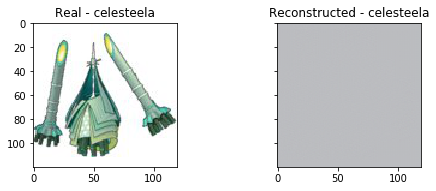

Epoch: 2, Training Loss: 0.07, time: 46.82


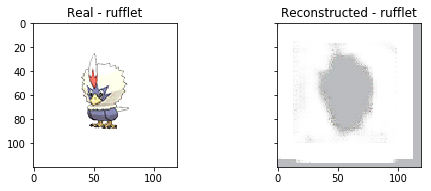

Epoch: 3, Training Loss: 0.06, time: 42.53


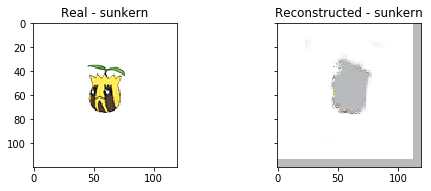

Epoch: 4, Training Loss: 0.06, time: 45.46


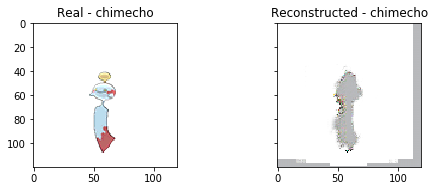

Epoch: 5, Training Loss: 0.05, time: 47.18


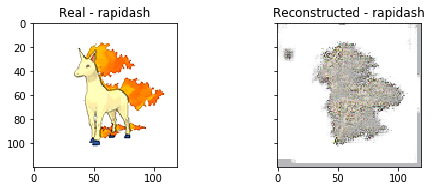

Epoch: 6, Training Loss: 0.04, time: 41.71


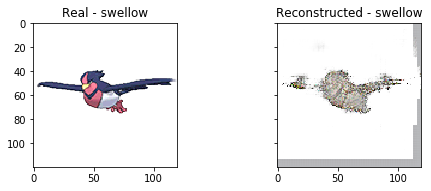

Epoch: 7, Training Loss: 0.03, time: 40.21


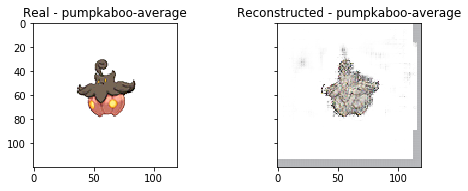

Epoch: 8, Training Loss: 0.03, time: 40.63


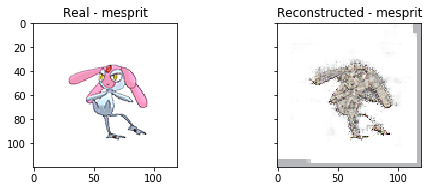

Epoch: 9, Training Loss: 0.03, time: 40.85


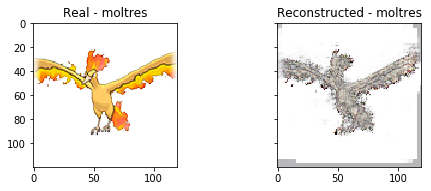

Epoch: 10, Training Loss: 0.03, time: 41.35


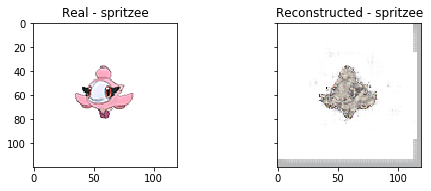

Epoch: 11, Training Loss: 0.03, time: 43.69


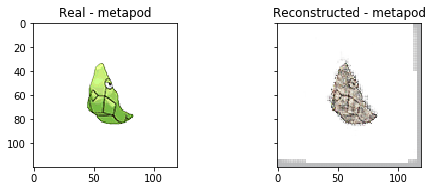

Epoch: 12, Training Loss: 0.03, time: 41.89


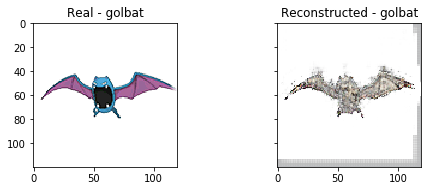

Epoch: 13, Training Loss: 0.03, time: 40.22


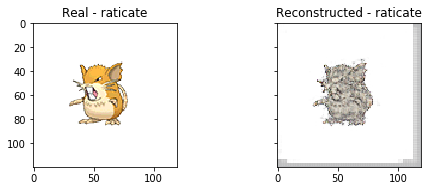

Epoch: 14, Training Loss: 0.02, time: 36.96


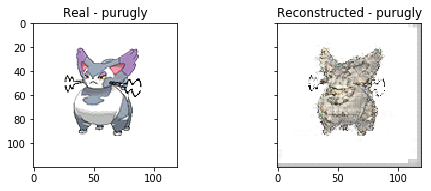

Epoch: 15, Training Loss: 0.02, time: 37.71


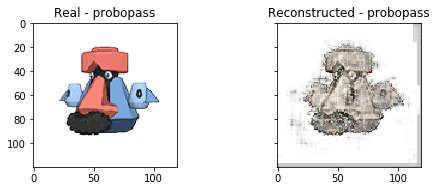

Epoch: 16, Training Loss: 0.02, time: 39.14


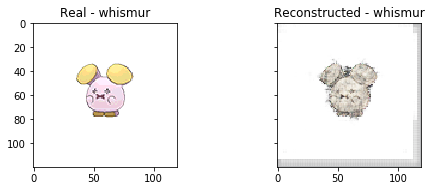

Epoch: 17, Training Loss: 0.02, time: 36.61


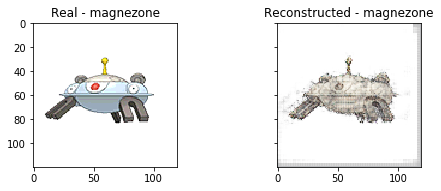

Epoch: 18, Training Loss: 0.02, time: 36.74


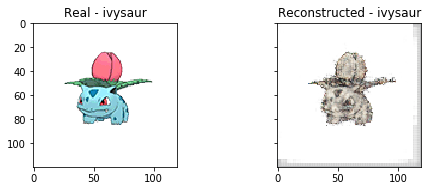

Epoch: 19, Training Loss: 0.02, time: 37.99


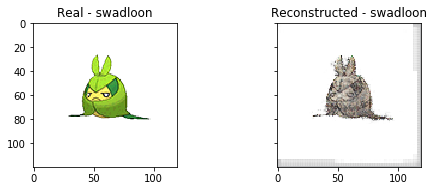

Epoch: 20, Training Loss: 0.02, time: 39.89


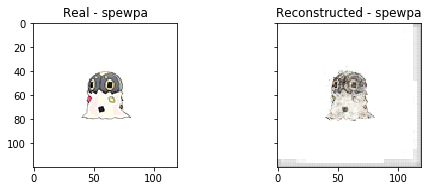

Epoch: 21, Training Loss: 0.01, time: 38.92


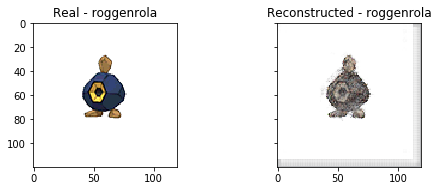

Epoch: 22, Training Loss: 0.01, time: 34.03


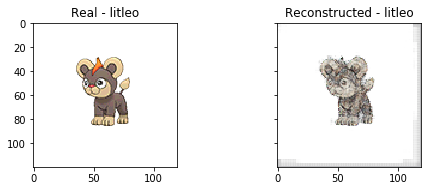

Epoch: 23, Training Loss: 0.01, time: 33.48


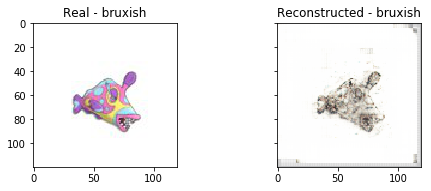

Epoch: 24, Training Loss: 0.01, time: 33.50


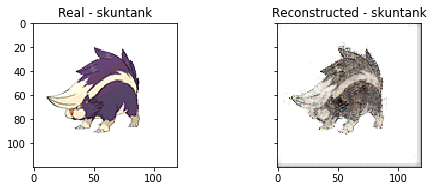

Epoch: 25, Training Loss: 0.01, time: 33.66


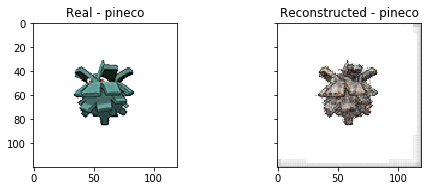

Epoch: 26, Training Loss: 0.01, time: 34.16


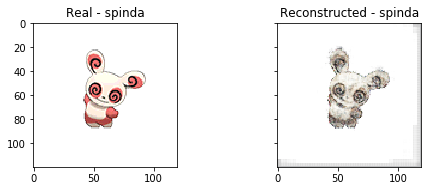

Epoch: 27, Training Loss: 0.01, time: 34.75


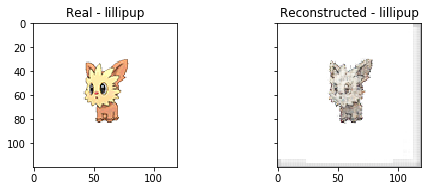

Epoch: 28, Training Loss: 0.01, time: 35.07


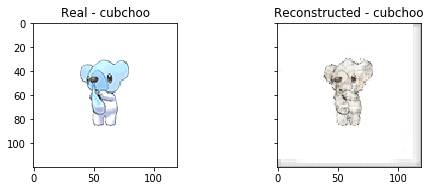

Epoch: 29, Training Loss: 0.01, time: 35.21


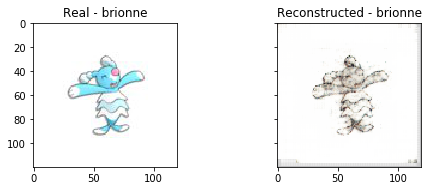

Epoch: 30, Training Loss: 0.01, time: 35.14


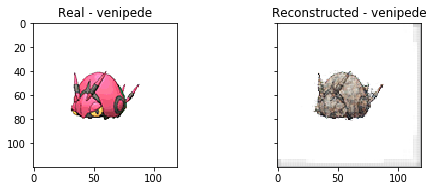

Epoch: 31, Training Loss: 0.01, time: 34.48


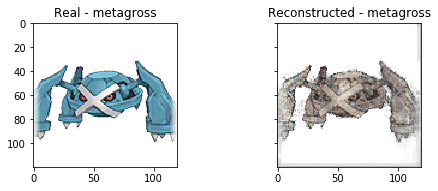

Epoch: 32, Training Loss: 0.01, time: 36.03


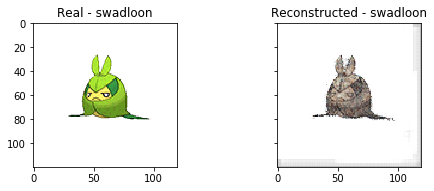

Epoch: 33, Training Loss: 0.01, time: 36.26


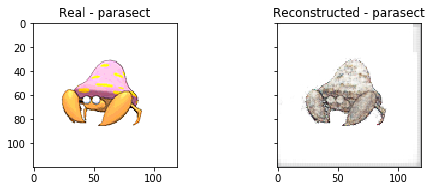

Epoch: 34, Training Loss: 0.01, time: 36.62


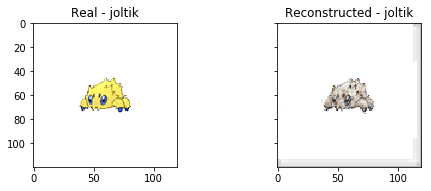

Epoch: 35, Training Loss: 0.01, time: 36.16


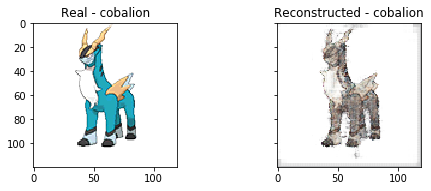

Epoch: 36, Training Loss: 0.01, time: 35.90


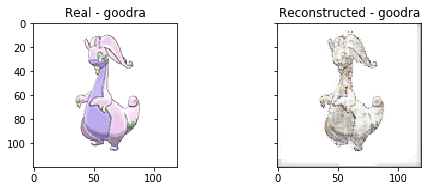

Epoch: 37, Training Loss: 0.01, time: 36.17


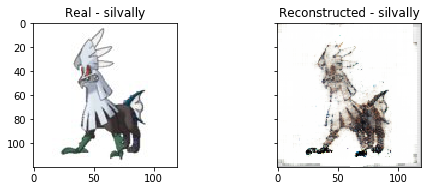

Epoch: 38, Training Loss: 0.01, time: 36.47


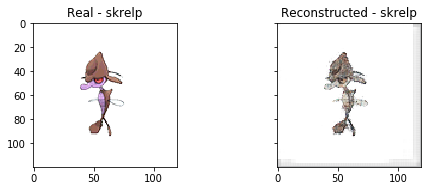

Epoch: 39, Training Loss: 0.01, time: 37.14


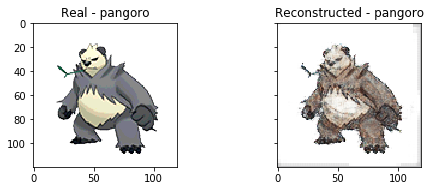

Epoch: 40, Training Loss: 0.01, time: 36.23


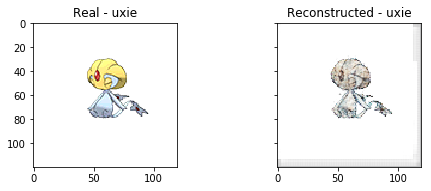

Epoch: 41, Training Loss: 0.01, time: 35.97


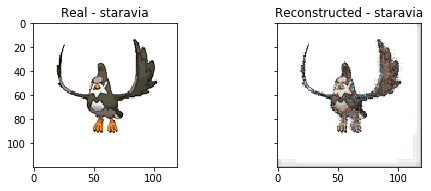

Epoch: 42, Training Loss: 0.01, time: 35.95


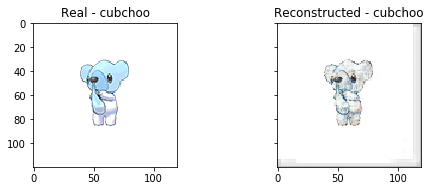

Epoch: 43, Training Loss: 0.01, time: 34.88


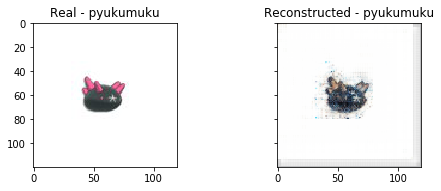

Epoch: 44, Training Loss: 0.01, time: 35.07


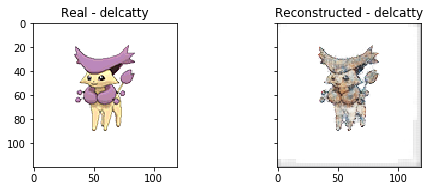

Epoch: 45, Training Loss: 0.01, time: 34.94


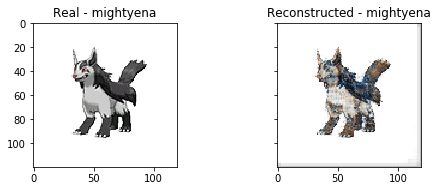

Epoch: 46, Training Loss: 0.01, time: 34.50


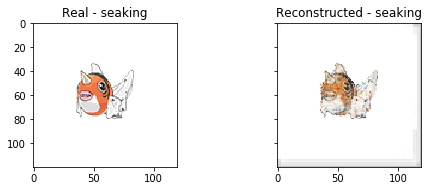

Epoch: 47, Training Loss: 0.01, time: 35.25


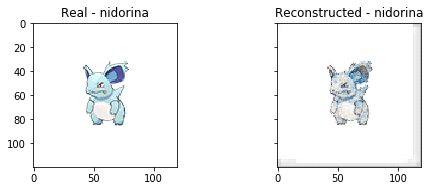

Epoch: 48, Training Loss: 0.01, time: 34.86


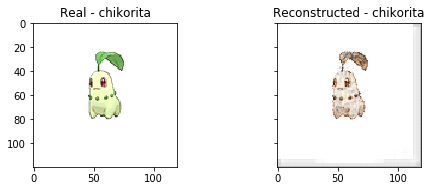

Epoch: 49, Training Loss: 0.01, time: 35.30


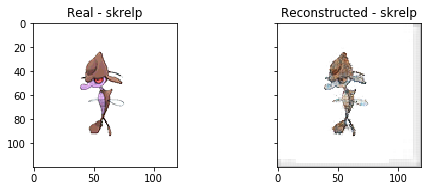

Epoch: 50, Training Loss: 0.01, time: 35.47


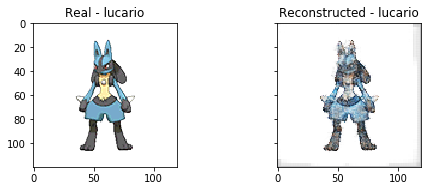

Epoch: 51, Training Loss: 0.01, time: 35.94


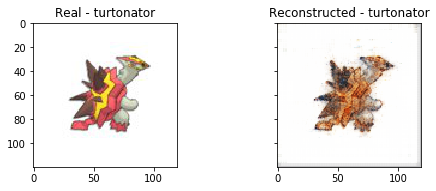

Epoch: 52, Training Loss: 0.01, time: 35.57


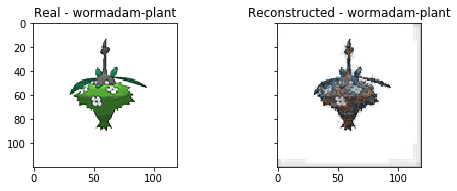

Epoch: 53, Training Loss: 0.01, time: 35.52


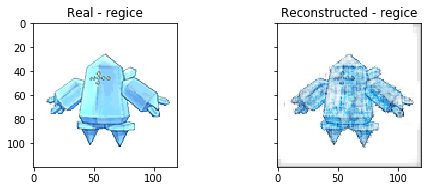

Epoch: 54, Training Loss: 0.01, time: 35.29


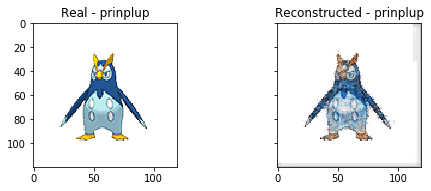

Epoch: 55, Training Loss: 0.01, time: 35.03


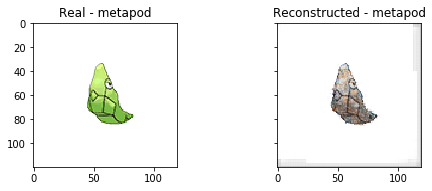

Epoch: 56, Training Loss: 0.01, time: 35.34


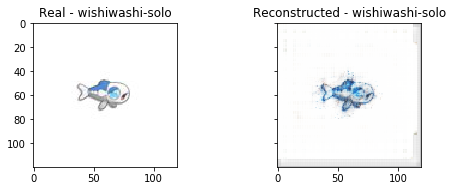

Epoch: 57, Training Loss: 0.01, time: 35.16


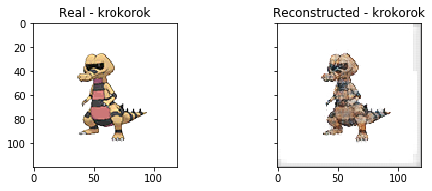

Epoch: 58, Training Loss: 0.01, time: 34.88


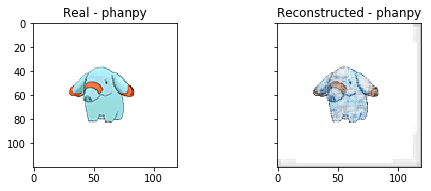

Epoch: 59, Training Loss: 0.01, time: 35.24


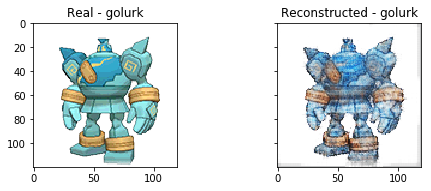

Epoch: 60, Training Loss: 0.01, time: 35.04


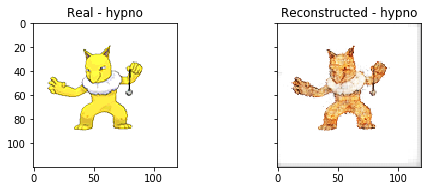

Epoch: 61, Training Loss: 0.01, time: 35.14


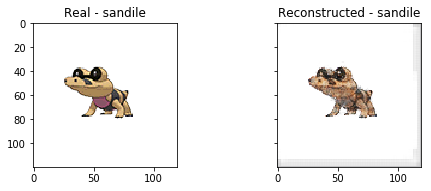

Epoch: 62, Training Loss: 0.01, time: 35.33


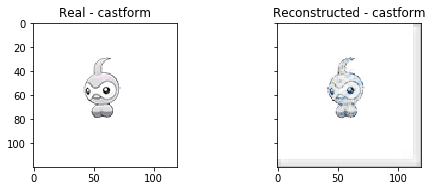

Epoch: 63, Training Loss: 0.01, time: 35.48


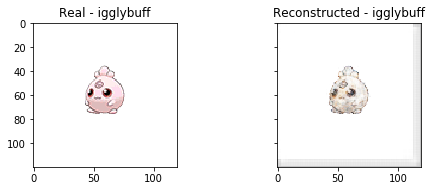

Epoch: 64, Training Loss: 0.01, time: 35.18


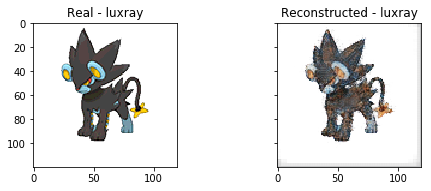

Epoch: 65, Training Loss: 0.01, time: 35.68


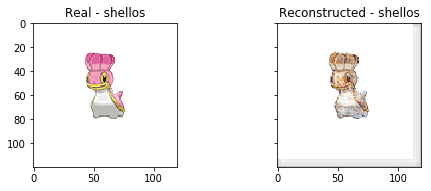

Epoch: 66, Training Loss: 0.01, time: 35.31


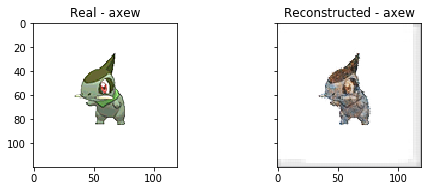

Epoch: 67, Training Loss: 0.01, time: 35.74


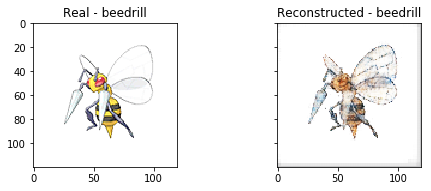

Epoch: 68, Training Loss: 0.01, time: 35.74


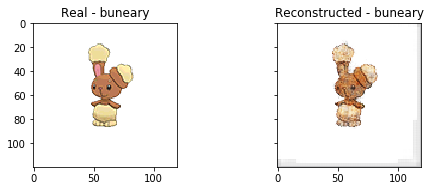

Epoch: 69, Training Loss: 0.01, time: 35.72


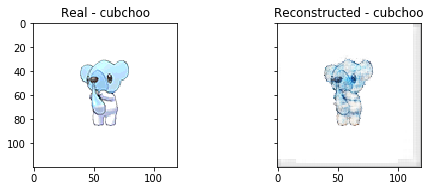

Epoch: 70, Training Loss: 0.01, time: 35.64


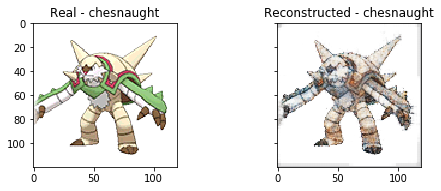

Epoch: 71, Training Loss: 0.01, time: 35.74


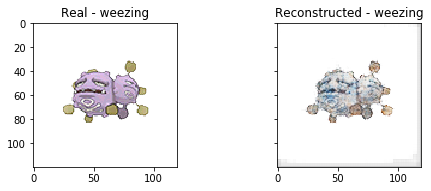

Epoch: 72, Training Loss: 0.01, time: 35.63


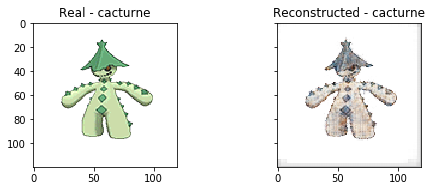

Epoch: 73, Training Loss: 0.01, time: 35.63


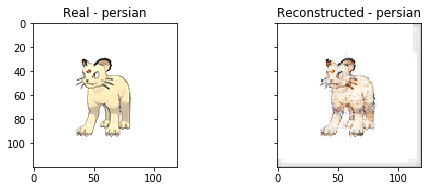

Epoch: 74, Training Loss: 0.01, time: 35.72


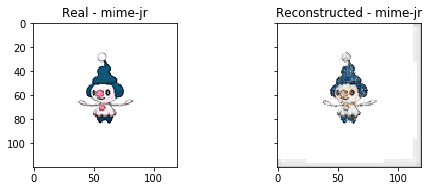

Epoch: 75, Training Loss: 0.01, time: 35.48


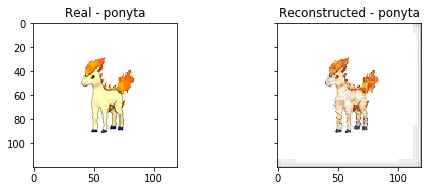

Epoch: 76, Training Loss: 0.01, time: 35.85


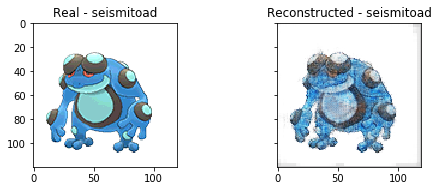

Epoch: 77, Training Loss: 0.01, time: 35.84


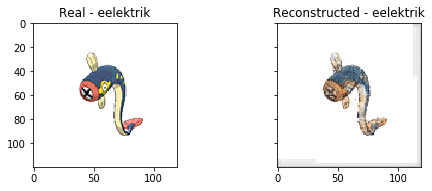

Epoch: 78, Training Loss: 0.01, time: 35.81


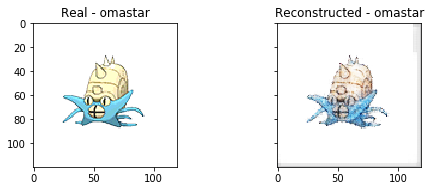

Epoch: 79, Training Loss: 0.01, time: 35.85


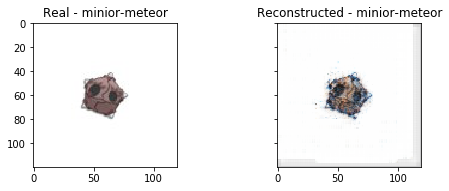

Epoch: 80, Training Loss: 0.01, time: 35.56


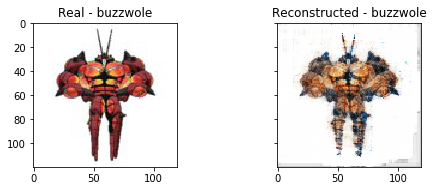

Epoch: 81, Training Loss: 0.01, time: 35.65


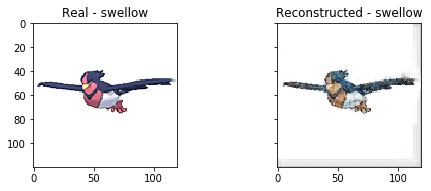

Epoch: 82, Training Loss: 0.01, time: 36.20


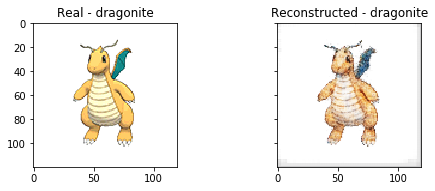

Epoch: 83, Training Loss: 0.01, time: 35.88


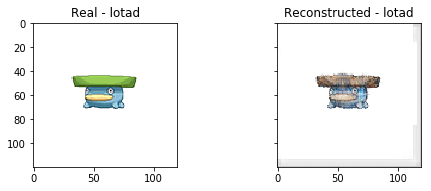

Epoch: 84, Training Loss: 0.01, time: 35.93


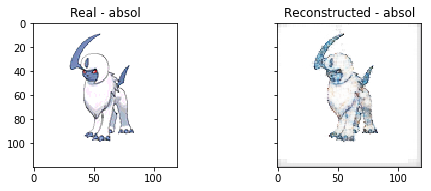

Epoch: 85, Training Loss: 0.01, time: 36.19


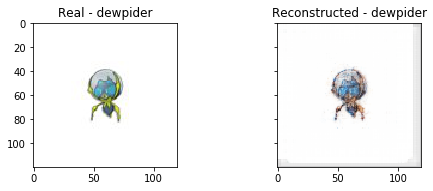

Epoch: 86, Training Loss: 0.01, time: 35.99


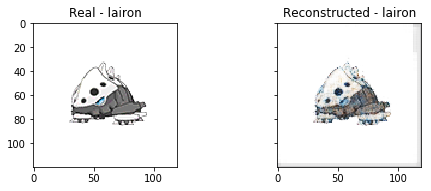

Epoch: 87, Training Loss: 0.01, time: 36.18


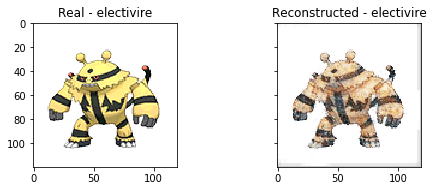

Epoch: 88, Training Loss: 0.01, time: 35.87


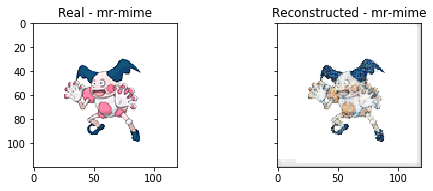

Epoch: 89, Training Loss: 0.01, time: 36.22


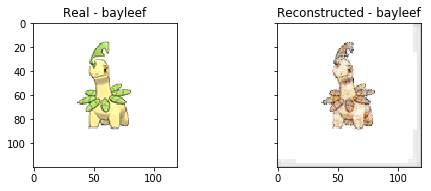

Epoch: 90, Training Loss: 0.01, time: 36.52


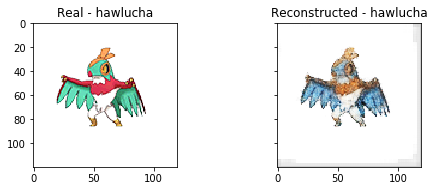

Epoch: 91, Training Loss: 0.01, time: 36.68


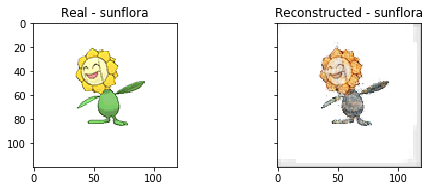

Epoch: 92, Training Loss: 0.01, time: 36.70


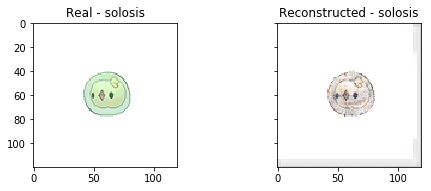

Epoch: 93, Training Loss: 0.01, time: 37.39


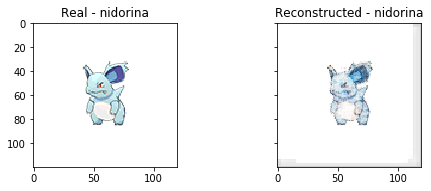

Epoch: 94, Training Loss: 0.01, time: 37.77


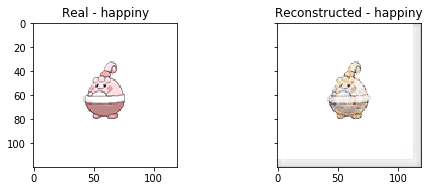

Epoch: 95, Training Loss: 0.01, time: 37.83


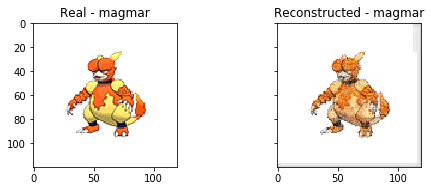

Epoch: 96, Training Loss: 0.01, time: 38.00


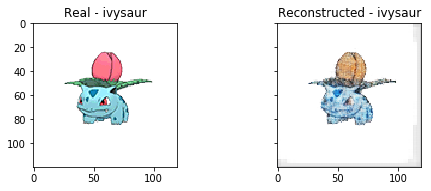

Epoch: 97, Training Loss: 0.01, time: 38.01


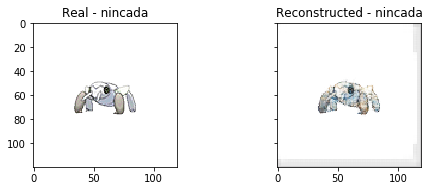

Epoch: 98, Training Loss: 0.01, time: 38.70


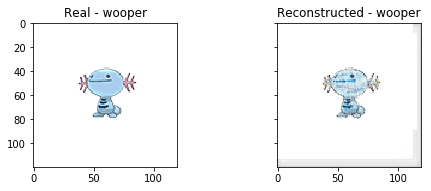

Epoch: 99, Training Loss: 0.01, time: 38.45


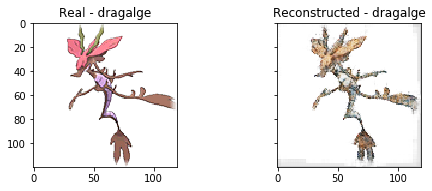

Epoch: 100, Training Loss: 0.01, time: 38.37


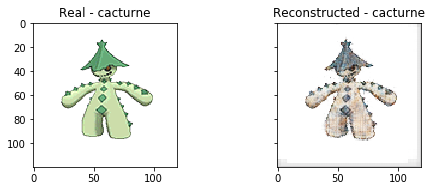

Epoch: 101, Training Loss: 0.01, time: 38.57


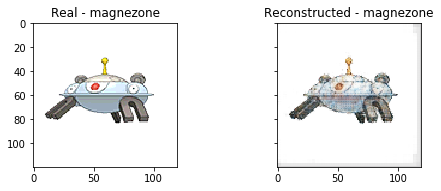

Epoch: 102, Training Loss: 0.01, time: 38.74


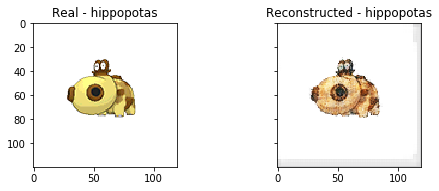

Epoch: 103, Training Loss: 0.01, time: 38.70


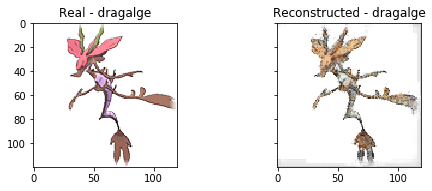

Epoch: 104, Training Loss: 0.01, time: 38.61


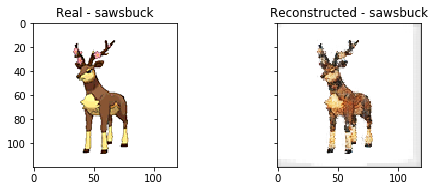

Epoch: 105, Training Loss: 0.01, time: 39.22


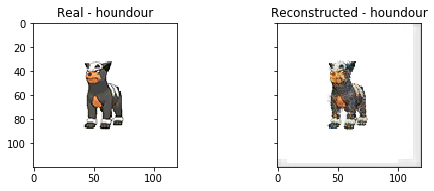

Epoch: 106, Training Loss: 0.01, time: 39.06


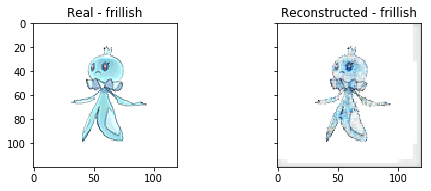

Epoch: 107, Training Loss: 0.01, time: 38.92


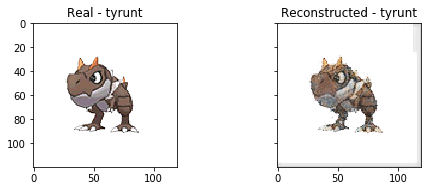

Epoch: 108, Training Loss: 0.01, time: 39.13


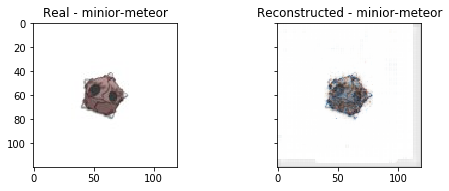

Epoch: 109, Training Loss: 0.01, time: 39.77


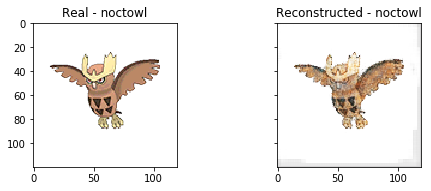

Epoch: 110, Training Loss: 0.01, time: 39.07


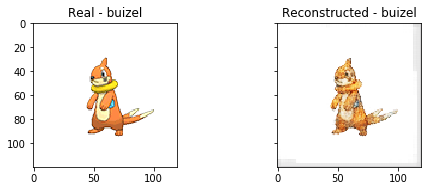

Epoch: 111, Training Loss: 0.01, time: 39.48


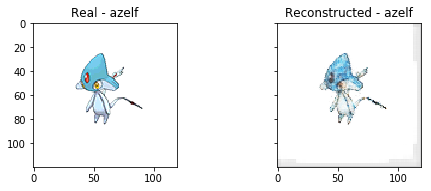

Epoch: 112, Training Loss: 0.01, time: 39.98


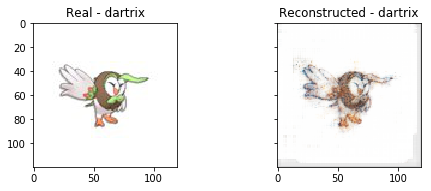

Epoch: 113, Training Loss: 0.01, time: 39.68


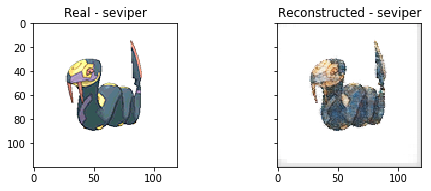

Epoch: 114, Training Loss: 0.01, time: 39.05


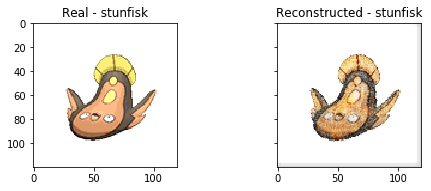

Epoch: 115, Training Loss: 0.01, time: 38.94


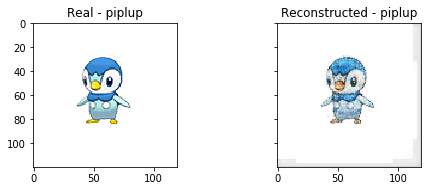

Epoch: 116, Training Loss: 0.01, time: 39.06


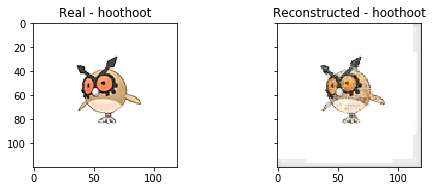

Epoch: 117, Training Loss: 0.01, time: 38.69


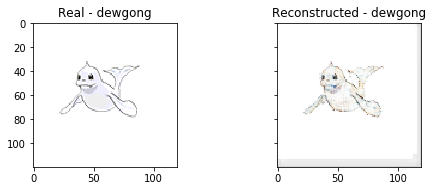

Epoch: 118, Training Loss: 0.01, time: 38.89


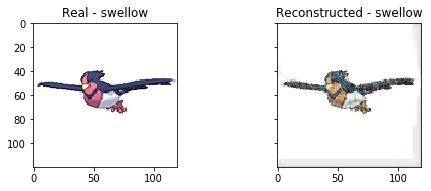

Epoch: 119, Training Loss: 0.01, time: 39.67


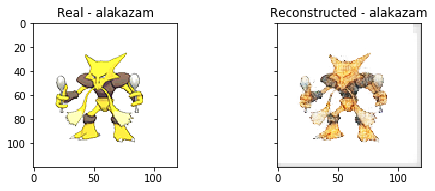

Epoch: 120, Training Loss: 0.01, time: 39.45


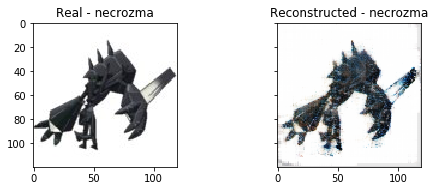

Epoch: 121, Training Loss: 0.01, time: 39.29


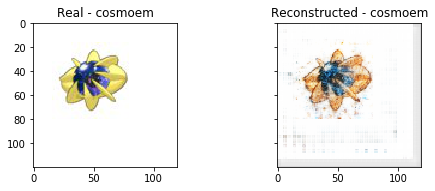

Epoch: 122, Training Loss: 0.01, time: 39.19


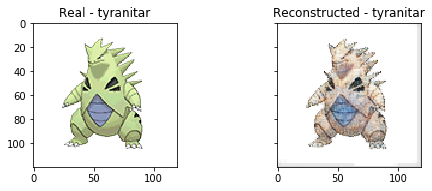

Epoch: 123, Training Loss: 0.01, time: 40.24


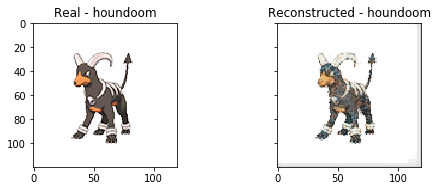

Epoch: 124, Training Loss: 0.01, time: 39.75


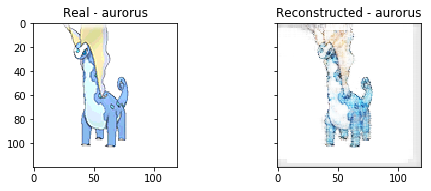

Epoch: 125, Training Loss: 0.01, time: 39.38


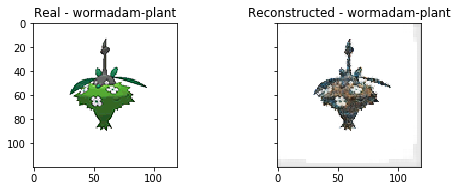

Epoch: 126, Training Loss: 0.01, time: 39.91


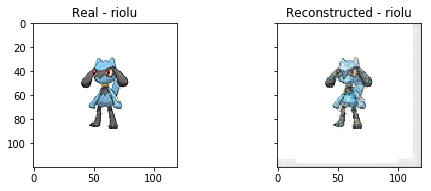

Epoch: 127, Training Loss: 0.01, time: 39.86


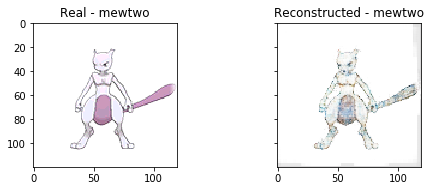

Epoch: 128, Training Loss: 0.01, time: 40.29


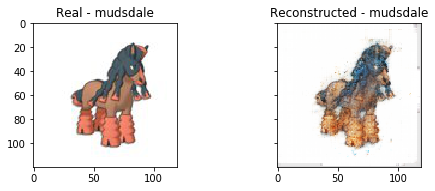

Epoch: 129, Training Loss: 0.01, time: 41.04


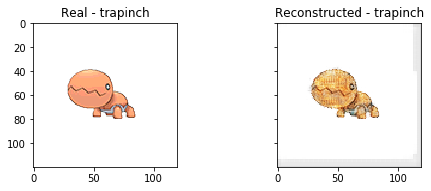

Epoch: 130, Training Loss: 0.01, time: 39.92


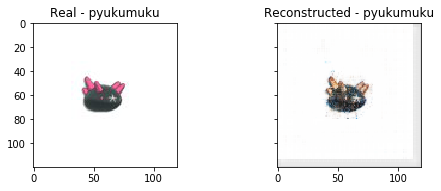

Epoch: 131, Training Loss: 0.01, time: 39.85


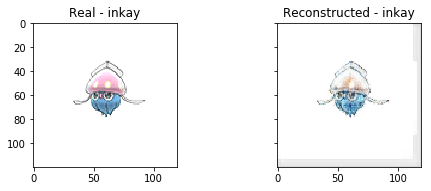

Epoch: 132, Training Loss: 0.01, time: 40.07


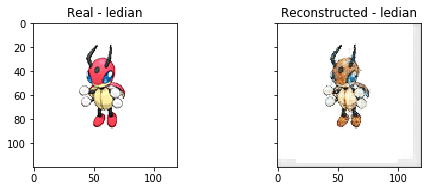

Epoch: 133, Training Loss: 0.01, time: 40.44


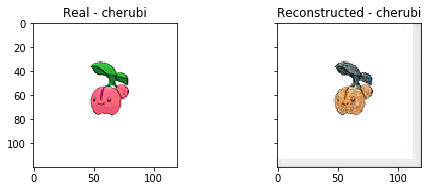

Epoch: 134, Training Loss: 0.01, time: 40.41


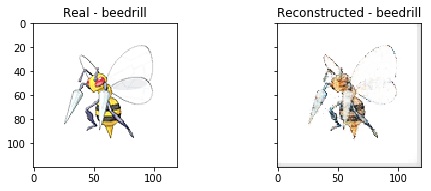

Epoch: 135, Training Loss: 0.01, time: 39.88


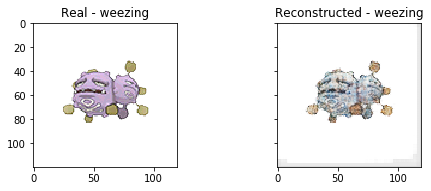

Epoch: 136, Training Loss: 0.01, time: 39.93


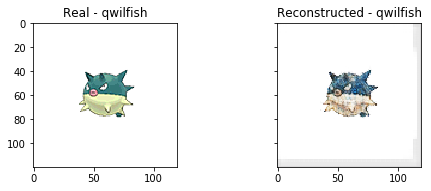

Epoch: 137, Training Loss: 0.01, time: 39.61


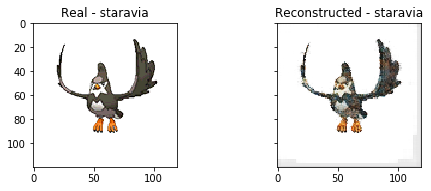

Epoch: 138, Training Loss: 0.01, time: 39.62


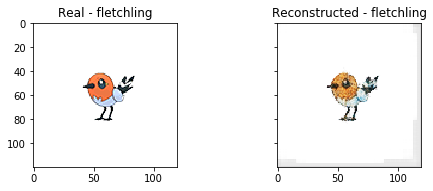

Epoch: 139, Training Loss: 0.01, time: 37.64


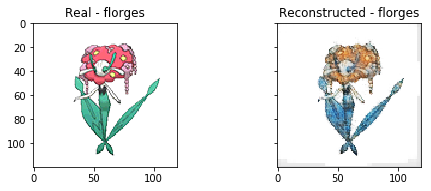

Epoch: 140, Training Loss: 0.01, time: 37.38


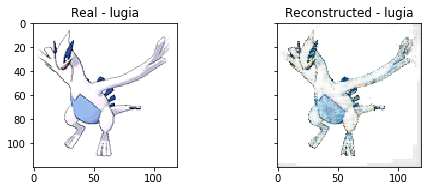

Epoch: 141, Training Loss: 0.01, time: 37.56


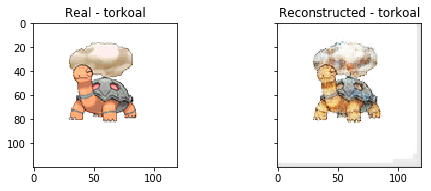

Epoch: 142, Training Loss: 0.01, time: 37.22


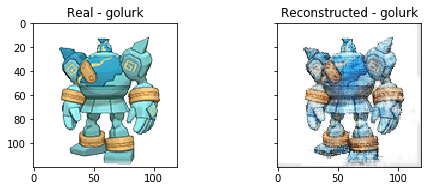

Epoch: 143, Training Loss: 0.01, time: 37.74


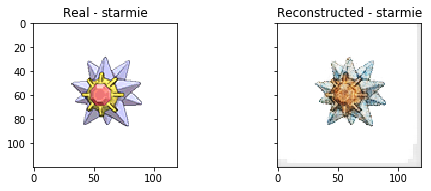

Epoch: 144, Training Loss: 0.01, time: 38.30


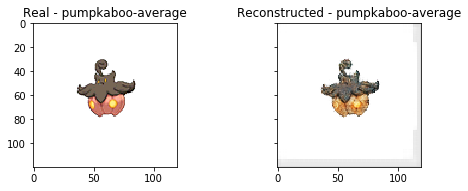

Epoch: 145, Training Loss: 0.01, time: 38.08


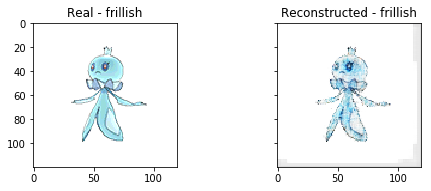

Epoch: 146, Training Loss: 0.01, time: 37.83


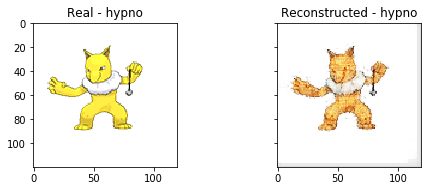

Epoch: 147, Training Loss: 0.01, time: 37.86


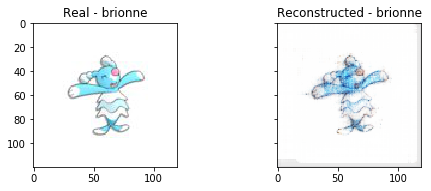

Epoch: 148, Training Loss: 0.01, time: 37.75


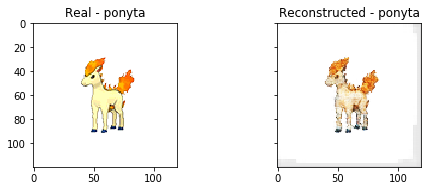

Epoch: 149, Training Loss: 0.01, time: 38.60


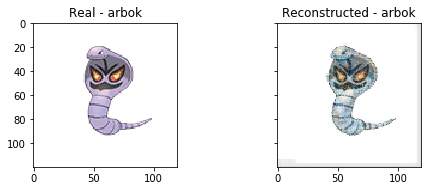

Epoch: 150, Training Loss: 0.01, time: 38.52


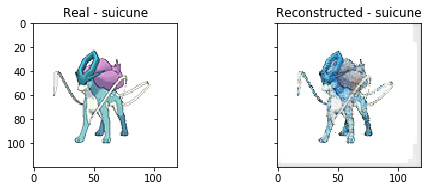

Epoch: 151, Training Loss: 0.01, time: 38.36


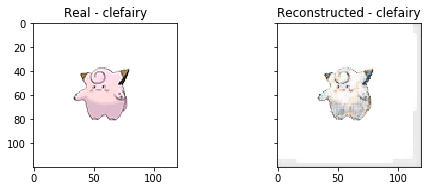

Epoch: 152, Training Loss: 0.01, time: 38.48


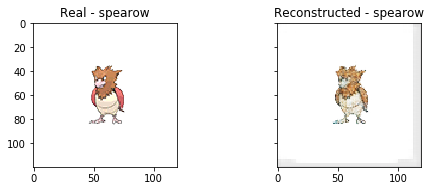

Epoch: 153, Training Loss: 0.01, time: 38.36


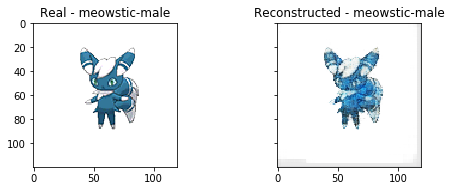

Epoch: 154, Training Loss: 0.01, time: 38.77


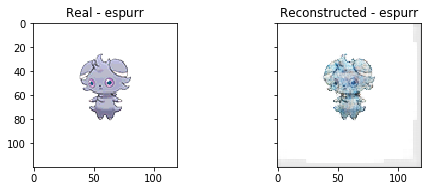

Epoch: 155, Training Loss: 0.01, time: 38.69


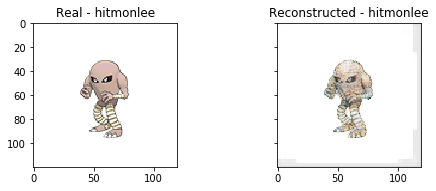

Epoch: 156, Training Loss: 0.01, time: 38.55


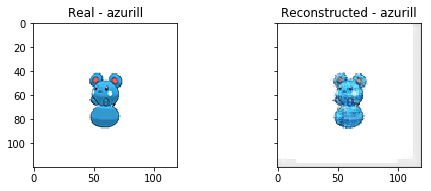

Epoch: 157, Training Loss: 0.01, time: 38.77


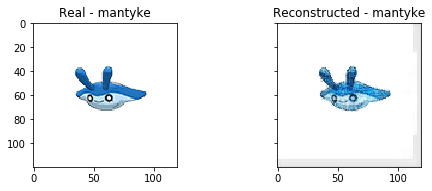

Epoch: 158, Training Loss: 0.01, time: 39.98


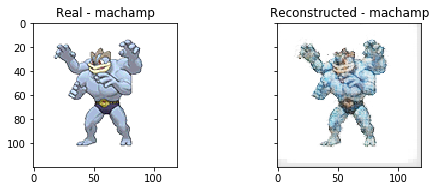

Epoch: 159, Training Loss: 0.01, time: 40.28


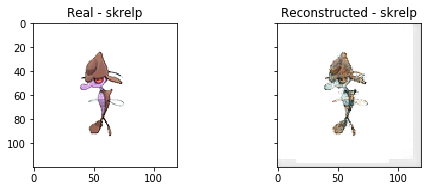

Epoch: 160, Training Loss: 0.01, time: 40.62


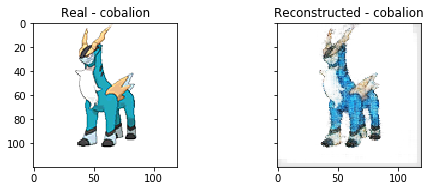

Epoch: 161, Training Loss: 0.01, time: 41.30


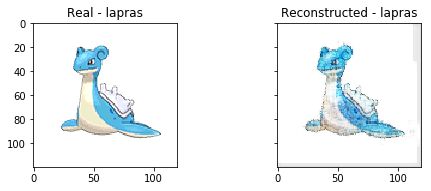

Epoch: 162, Training Loss: 0.01, time: 41.31


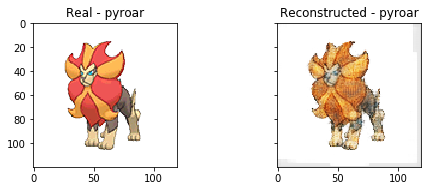

Epoch: 163, Training Loss: 0.01, time: 41.94


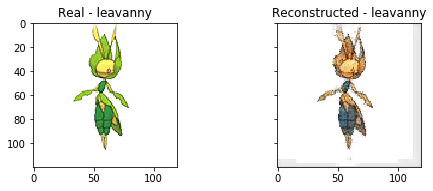

Epoch: 164, Training Loss: 0.01, time: 41.96


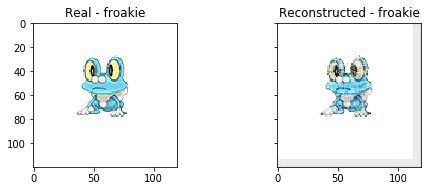

Epoch: 165, Training Loss: 0.01, time: 42.37


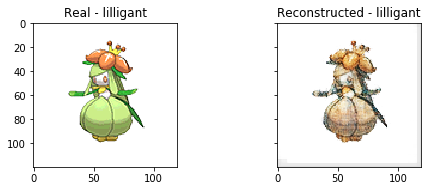

Epoch: 166, Training Loss: 0.01, time: 42.56


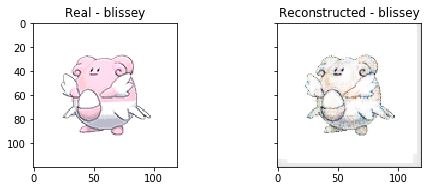

Epoch: 167, Training Loss: 0.01, time: 43.51


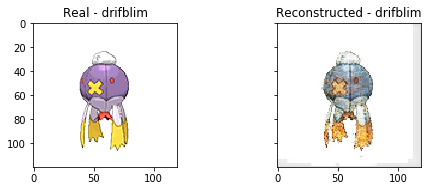

Epoch: 168, Training Loss: 0.01, time: 43.79


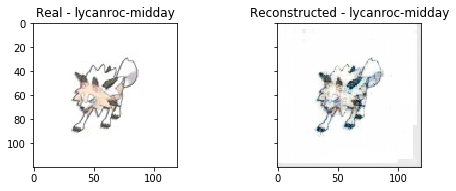

Epoch: 169, Training Loss: 0.01, time: 43.96


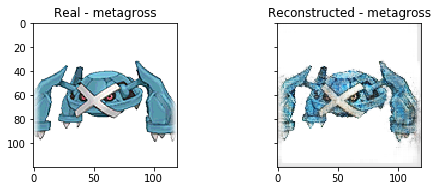

Epoch: 170, Training Loss: 0.01, time: 44.44


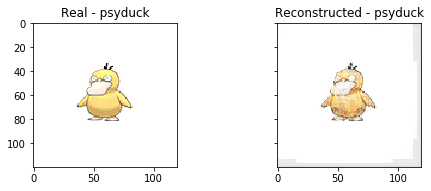

Epoch: 171, Training Loss: 0.01, time: 44.44


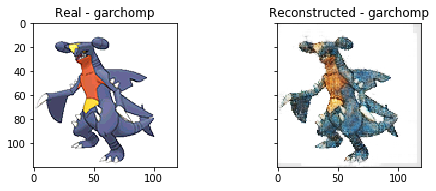

Epoch: 172, Training Loss: 0.02, time: 42.18


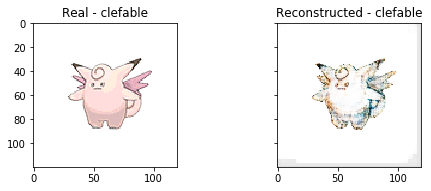

Epoch: 173, Training Loss: 0.01, time: 40.41


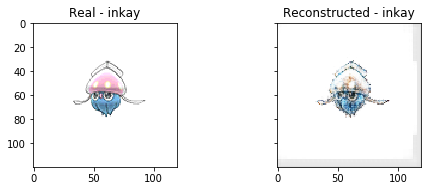

Epoch: 174, Training Loss: 0.01, time: 40.84


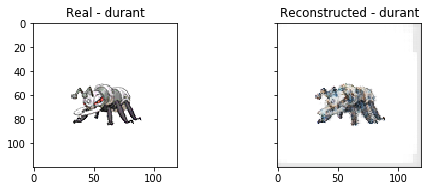

Epoch: 175, Training Loss: 0.01, time: 41.30


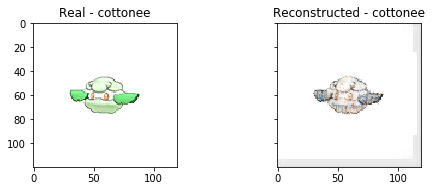

Epoch: 176, Training Loss: 0.01, time: 42.13


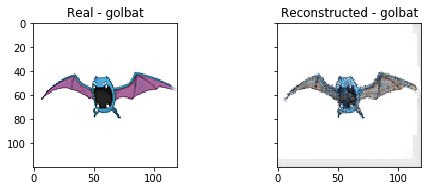

Epoch: 177, Training Loss: 0.01, time: 41.58


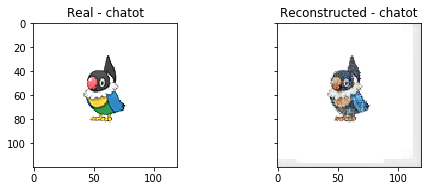

Epoch: 178, Training Loss: 0.01, time: 42.69


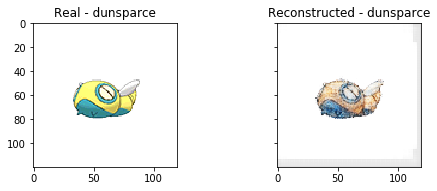

Epoch: 179, Training Loss: 0.01, time: 42.78


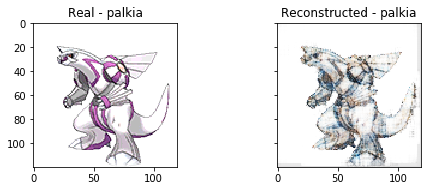

Epoch: 180, Training Loss: 0.01, time: 43.99


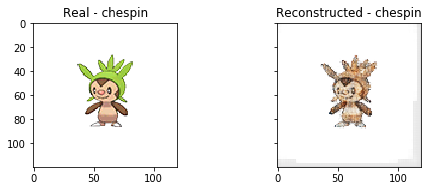

Epoch: 181, Training Loss: 0.01, time: 44.69


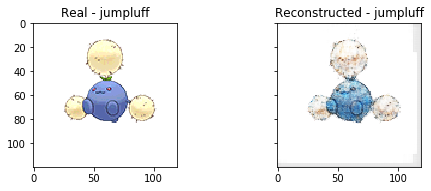

Epoch: 182, Training Loss: 0.01, time: 45.51


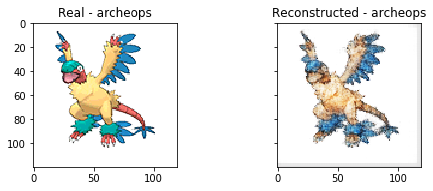

Epoch: 183, Training Loss: 0.01, time: 45.49


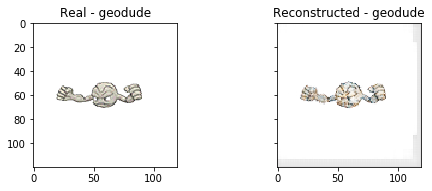

Epoch: 184, Training Loss: 0.01, time: 46.05


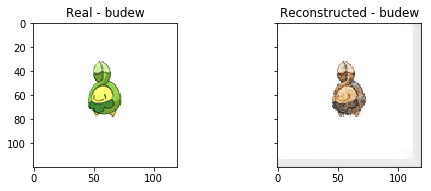

Epoch: 185, Training Loss: 0.01, time: 46.77


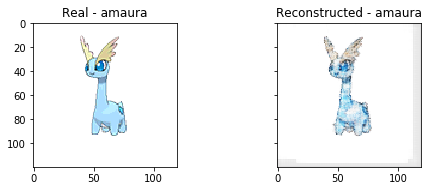

Epoch: 186, Training Loss: 0.01, time: 47.15


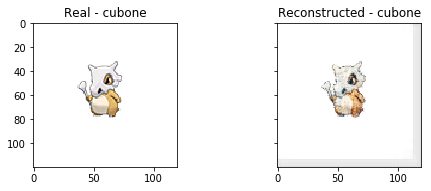

Epoch: 187, Training Loss: 0.01, time: 48.10


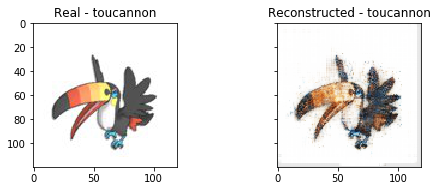

Epoch: 188, Training Loss: 0.01, time: 48.53


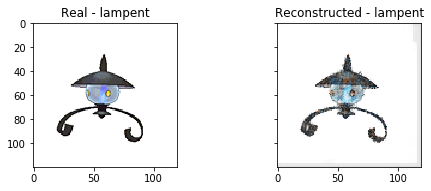

Epoch: 189, Training Loss: 0.01, time: 49.16


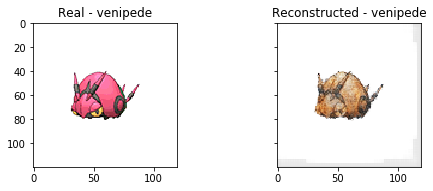

Epoch: 190, Training Loss: 0.01, time: 49.09


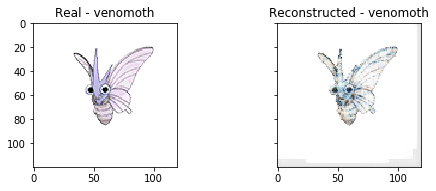

Epoch: 191, Training Loss: 0.01, time: 50.17


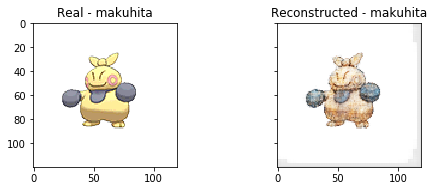

Epoch: 192, Training Loss: 0.01, time: 50.49


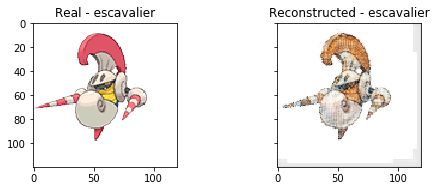

Epoch: 193, Training Loss: 0.01, time: 50.26


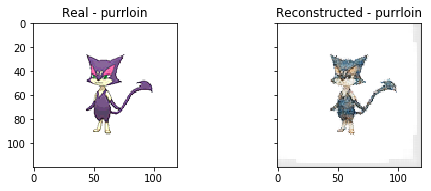

Epoch: 194, Training Loss: 0.01, time: 51.34


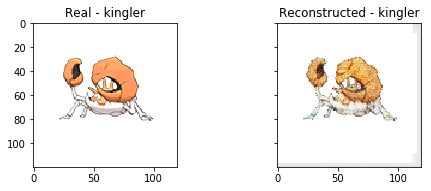

Epoch: 195, Training Loss: 0.01, time: 51.19


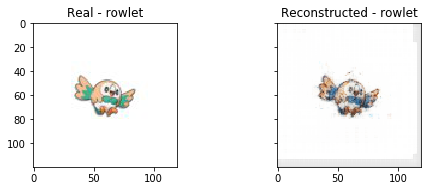

Epoch: 196, Training Loss: 0.01, time: 52.47


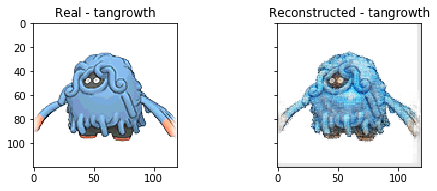

Epoch: 197, Training Loss: 0.01, time: 52.67


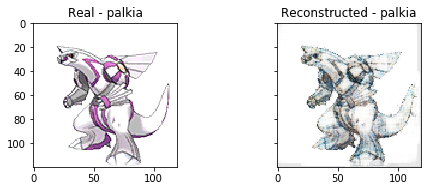

Epoch: 198, Training Loss: 0.01, time: 53.70


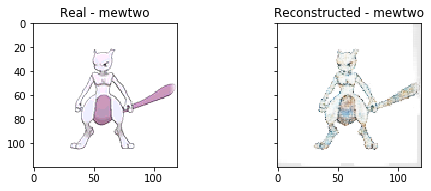

Epoch: 199, Training Loss: 0.01, time: 54.39


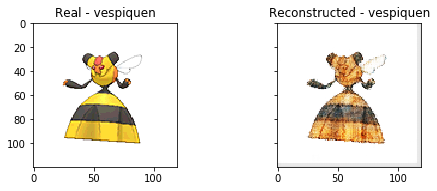

Epoch: 200, Training Loss: 0.01, time: 53.94


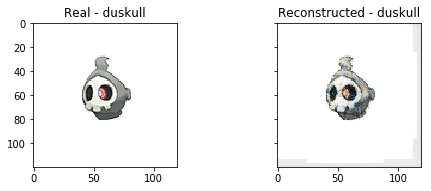

Epoch: 201, Training Loss: 0.01, time: 54.63


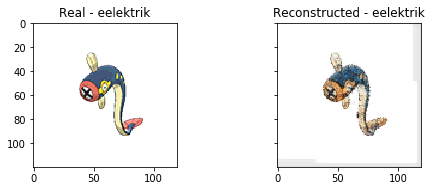

Epoch: 202, Training Loss: 0.01, time: 55.72


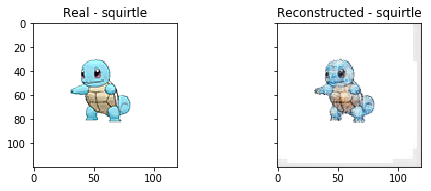

Epoch: 203, Training Loss: 0.01, time: 57.06


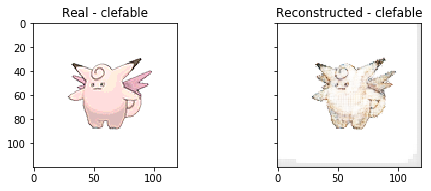

Epoch: 204, Training Loss: 0.01, time: 58.32


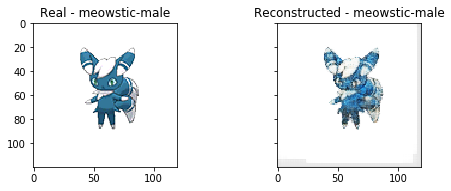

Epoch: 205, Training Loss: 0.01, time: 58.91


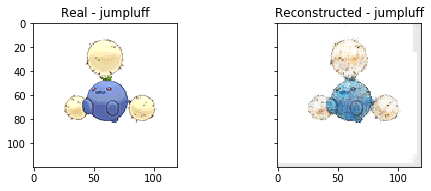

Epoch: 206, Training Loss: 0.01, time: 59.04


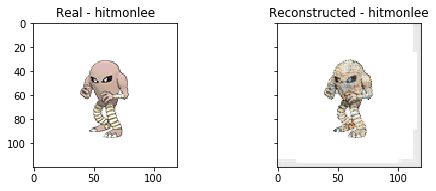

Epoch: 207, Training Loss: 0.01, time: 58.57


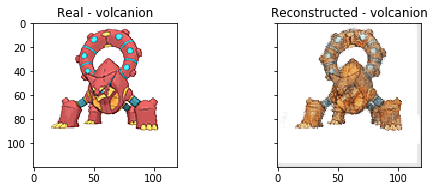

Epoch: 208, Training Loss: 0.01, time: 59.05


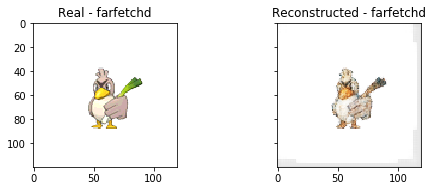

Epoch: 209, Training Loss: 0.01, time: 61.04


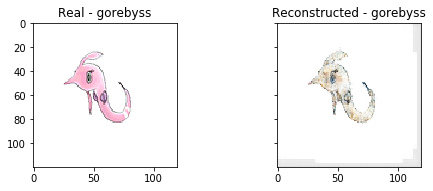

Epoch: 210, Training Loss: 0.01, time: 60.42


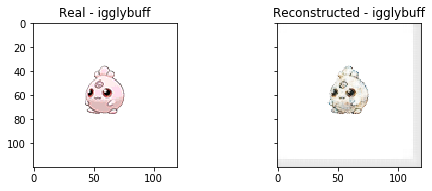

Epoch: 211, Training Loss: 0.01, time: 60.45


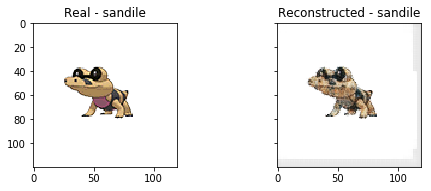

Epoch: 212, Training Loss: 0.01, time: 60.99


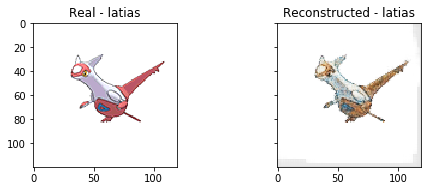

Epoch: 213, Training Loss: 0.01, time: 61.69


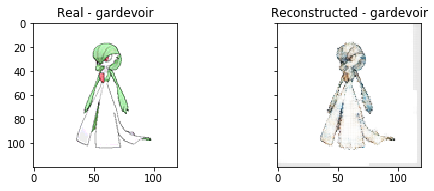

Epoch: 214, Training Loss: 0.01, time: 61.27


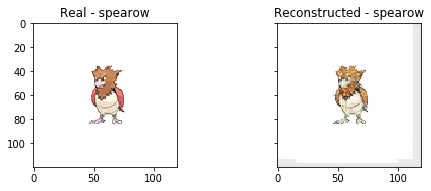

Epoch: 215, Training Loss: 0.01, time: 61.64


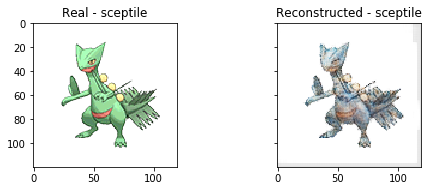

Epoch: 216, Training Loss: 0.01, time: 61.13


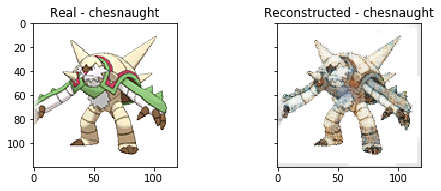

Epoch: 217, Training Loss: 0.01, time: 60.74


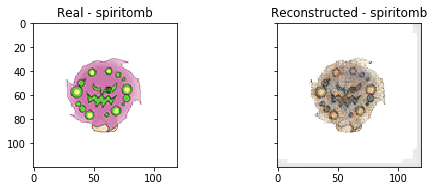

Epoch: 218, Training Loss: 0.01, time: 61.27


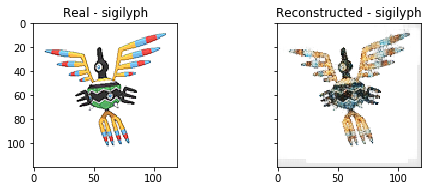

Epoch: 219, Training Loss: 0.01, time: 60.31


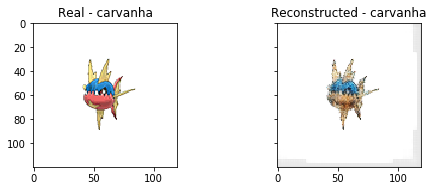

Epoch: 220, Training Loss: 0.01, time: 59.92


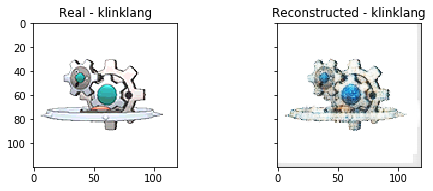

Epoch: 221, Training Loss: 0.01, time: 58.90


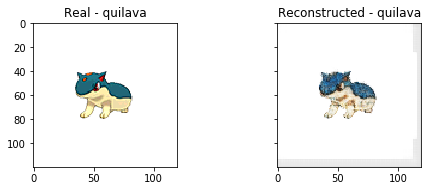

Epoch: 222, Training Loss: 0.01, time: 59.54


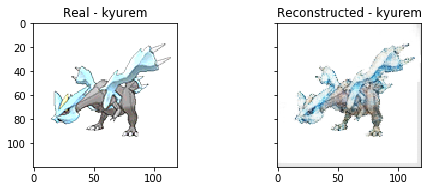

Epoch: 223, Training Loss: 0.01, time: 59.52


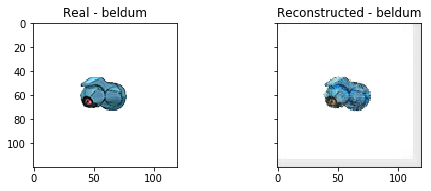

Epoch: 224, Training Loss: 0.01, time: 59.41


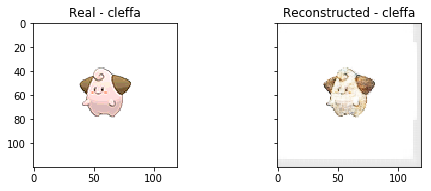

Epoch: 225, Training Loss: 0.01, time: 59.84


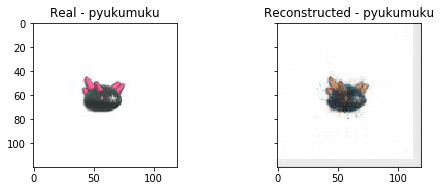

Epoch: 226, Training Loss: 0.01, time: 59.44


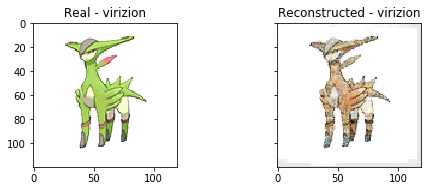

Epoch: 227, Training Loss: 0.01, time: 60.42


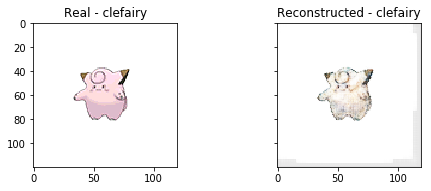

Epoch: 228, Training Loss: 0.01, time: 60.88


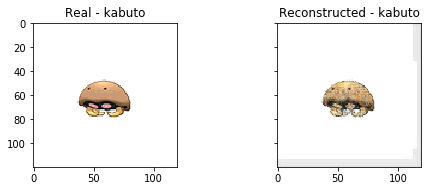

Epoch: 229, Training Loss: 0.01, time: 61.39


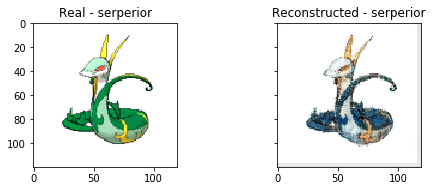

Epoch: 230, Training Loss: 0.01, time: 61.69


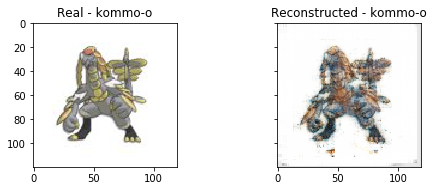

Epoch: 231, Training Loss: 0.01, time: 61.91


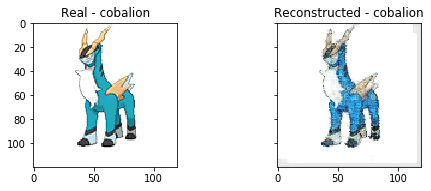

Epoch: 232, Training Loss: 0.01, time: 62.18


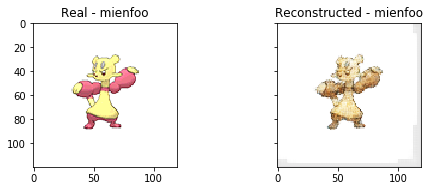

Epoch: 233, Training Loss: 0.01, time: 66.37


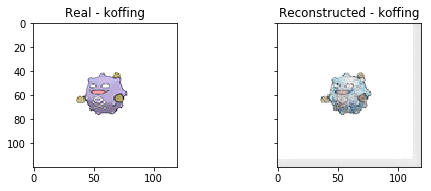

Epoch: 234, Training Loss: 0.01, time: 63.00


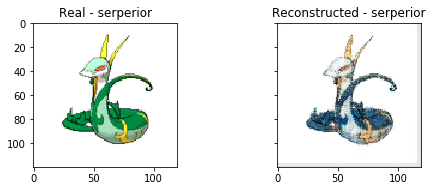

Epoch: 235, Training Loss: 0.01, time: 63.38


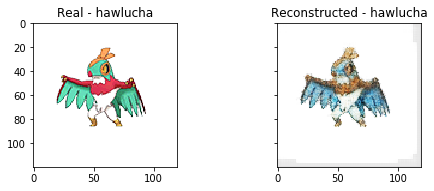

Epoch: 236, Training Loss: 0.01, time: 62.08


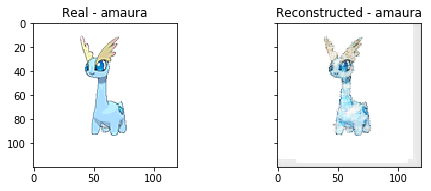

Epoch: 237, Training Loss: 0.01, time: 62.16


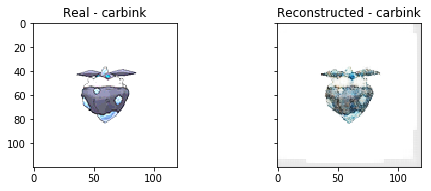

Epoch: 238, Training Loss: 0.01, time: 63.03


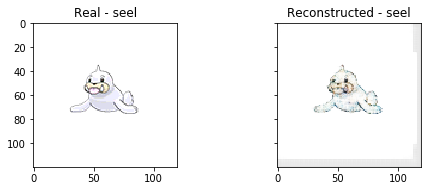

Epoch: 239, Training Loss: 0.01, time: 61.87


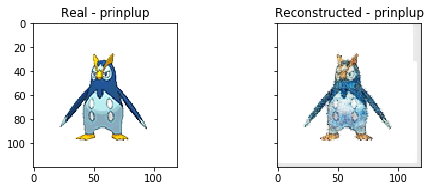

Epoch: 240, Training Loss: 0.01, time: 63.27


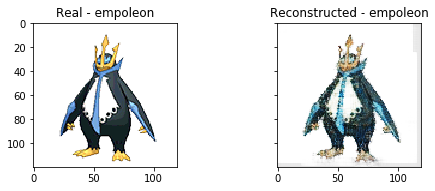

Epoch: 241, Training Loss: 0.01, time: 62.68


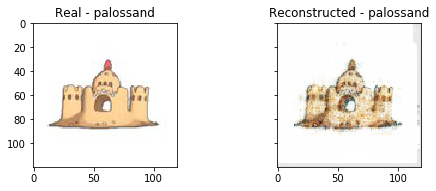

Epoch: 242, Training Loss: 0.01, time: 63.00


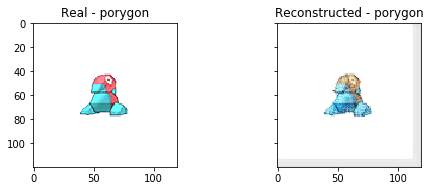

Epoch: 243, Training Loss: 0.01, time: 63.84


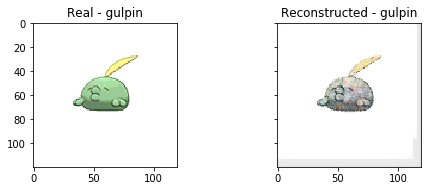

Epoch: 244, Training Loss: 0.01, time: 64.52


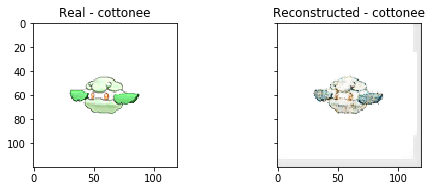

Epoch: 245, Training Loss: 0.01, time: 63.69


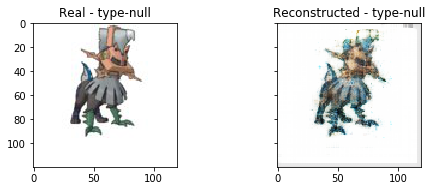

Epoch: 246, Training Loss: 0.01, time: 67.50


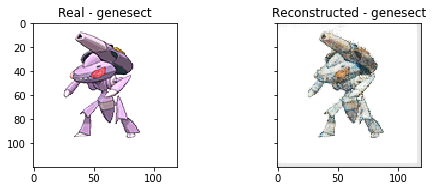

Epoch: 247, Training Loss: 0.01, time: 62.04


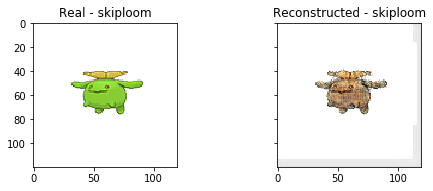

Epoch: 248, Training Loss: 0.01, time: 61.88


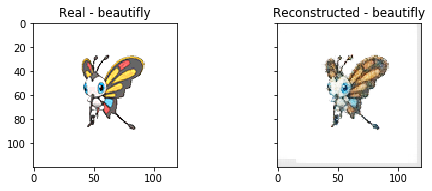

Epoch: 249, Training Loss: 0.01, time: 63.10


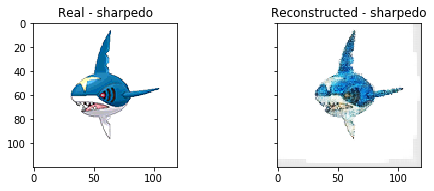

Epoch: 250, Training Loss: 0.01, time: 63.17


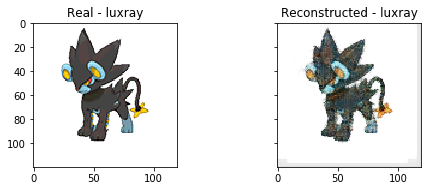

Epoch: 251, Training Loss: 0.01, time: 63.57


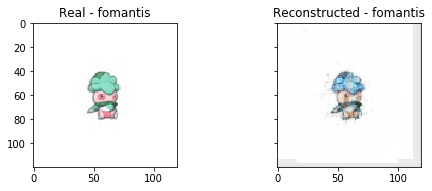

Epoch: 252, Training Loss: 0.01, time: 63.73


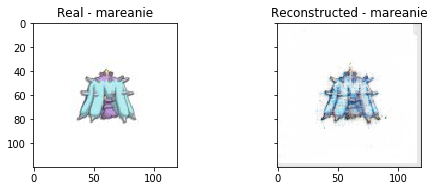

Epoch: 253, Training Loss: 0.01, time: 63.12


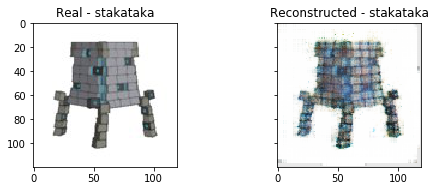

Epoch: 254, Training Loss: 0.01, time: 62.99


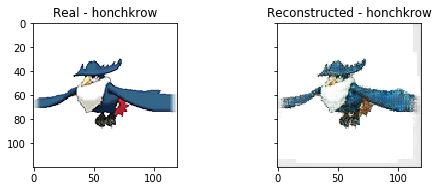

Epoch: 255, Training Loss: 0.01, time: 63.71


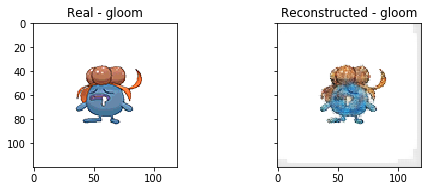

Epoch: 256, Training Loss: 0.01, time: 62.38


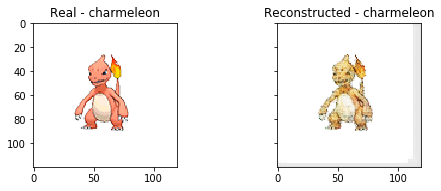

Epoch: 257, Training Loss: 0.01, time: 64.37


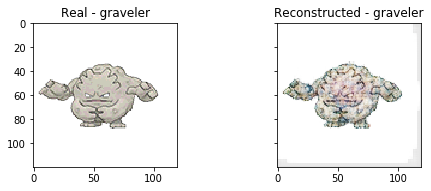

Epoch: 258, Training Loss: 0.01, time: 63.02


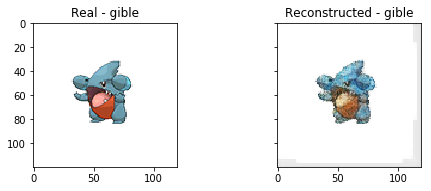

Epoch: 259, Training Loss: 0.01, time: 63.22


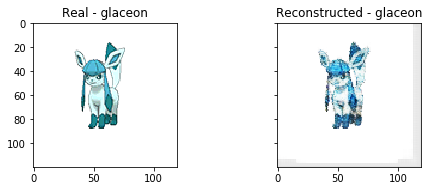

Epoch: 260, Training Loss: 0.01, time: 63.57


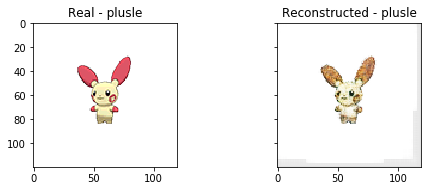

Epoch: 261, Training Loss: 0.01, time: 64.80


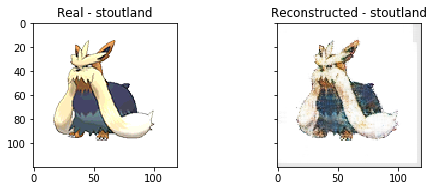

Epoch: 262, Training Loss: 0.01, time: 64.65


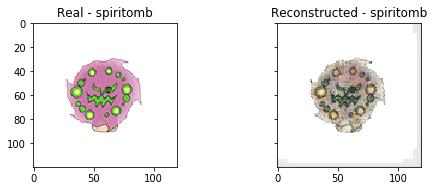

Epoch: 263, Training Loss: 0.01, time: 64.05


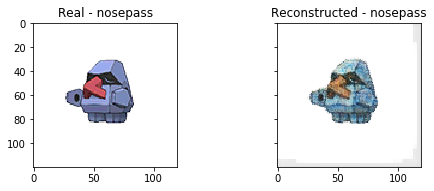

Epoch: 264, Training Loss: 0.01, time: 64.06


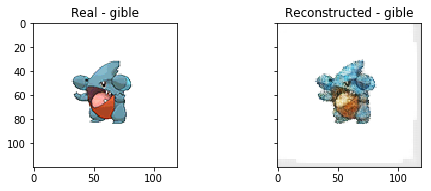

Epoch: 265, Training Loss: 0.01, time: 63.61


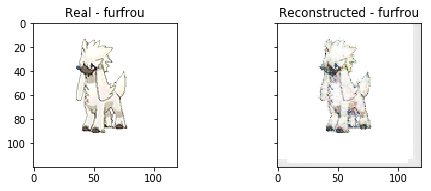

Epoch: 266, Training Loss: 0.01, time: 64.65


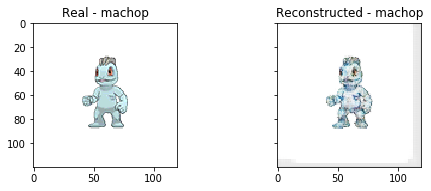

Epoch: 267, Training Loss: 0.01, time: 65.83


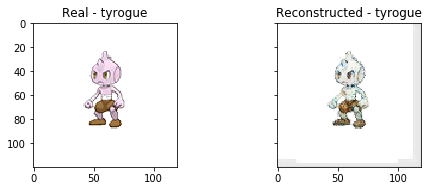

Epoch: 268, Training Loss: 0.01, time: 65.79


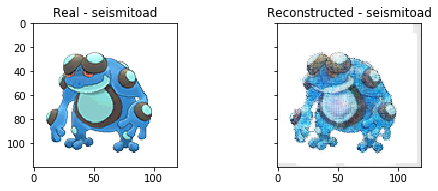

Epoch: 269, Training Loss: 0.01, time: 65.00


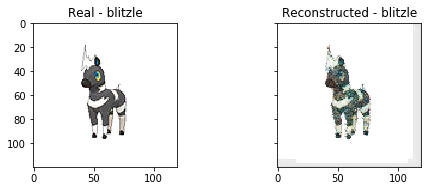

Epoch: 270, Training Loss: 0.01, time: 66.02


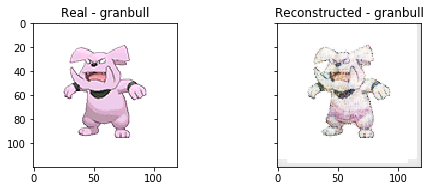

Epoch: 271, Training Loss: 0.01, time: 64.79


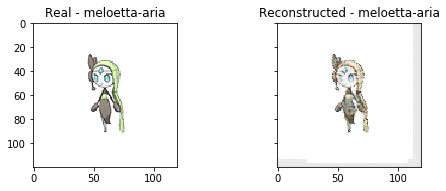

Epoch: 272, Training Loss: 0.01, time: 64.15


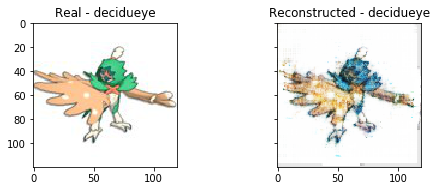

Epoch: 273, Training Loss: 0.01, time: 64.04


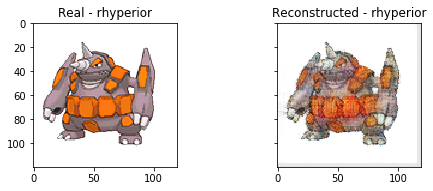

Epoch: 274, Training Loss: 0.01, time: 64.54


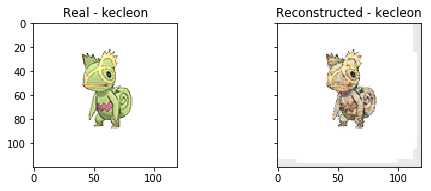

Epoch: 275, Training Loss: 0.01, time: 64.80


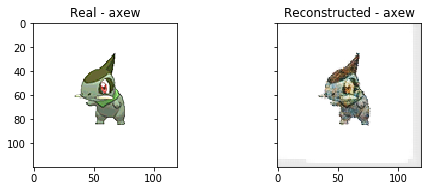

Epoch: 276, Training Loss: 0.01, time: 65.74


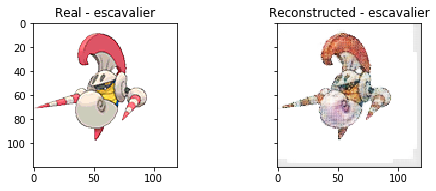

Epoch: 277, Training Loss: 0.01, time: 64.41


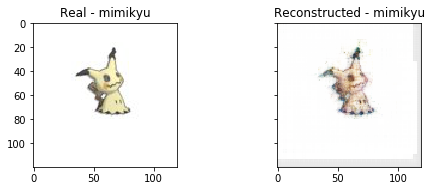

Epoch: 278, Training Loss: 0.01, time: 65.23


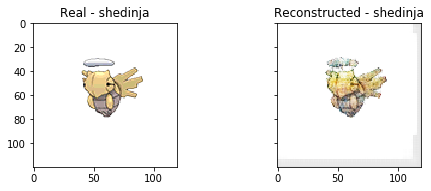

Epoch: 279, Training Loss: 0.01, time: 66.48


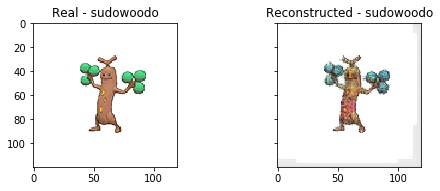

Epoch: 280, Training Loss: 0.01, time: 65.93


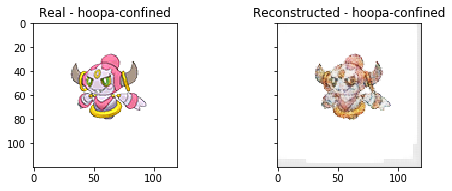

Epoch: 281, Training Loss: 0.01, time: 62.17


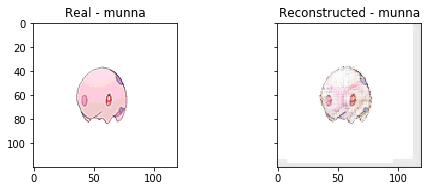

Epoch: 282, Training Loss: 0.01, time: 62.37


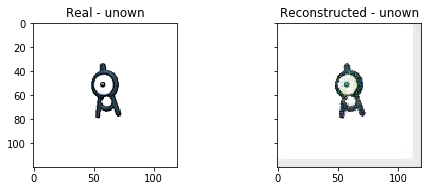

Epoch: 283, Training Loss: 0.01, time: 61.50


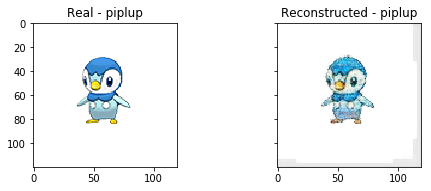

Epoch: 284, Training Loss: 0.01, time: 60.67


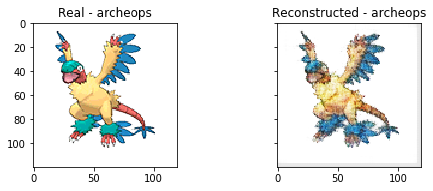

Epoch: 285, Training Loss: 0.01, time: 61.86


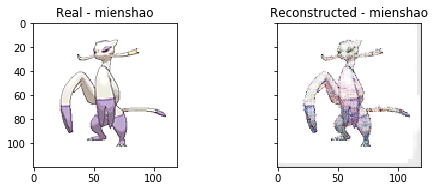

Epoch: 286, Training Loss: 0.01, time: 62.14


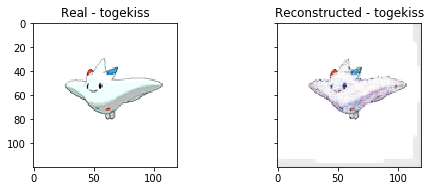

Epoch: 287, Training Loss: 0.01, time: 62.34


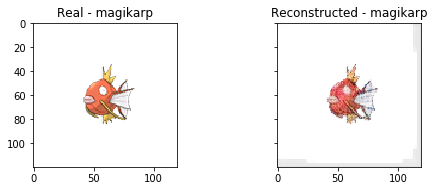

Epoch: 288, Training Loss: 0.01, time: 63.11


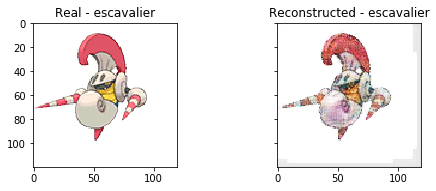

Epoch: 289, Training Loss: 0.01, time: 64.79


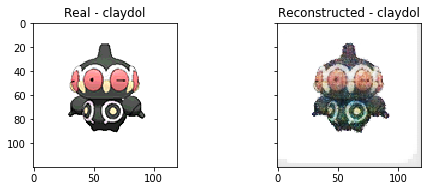

Epoch: 290, Training Loss: 0.01, time: 64.67


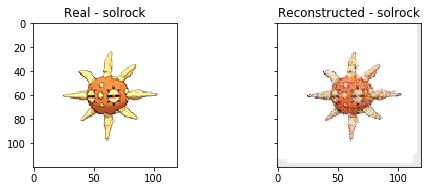

Epoch: 291, Training Loss: 0.01, time: 62.45


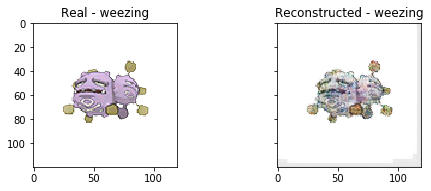

Epoch: 292, Training Loss: 0.01, time: 62.73


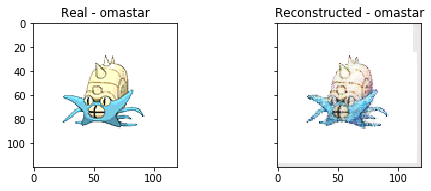

Epoch: 293, Training Loss: 0.01, time: 62.11


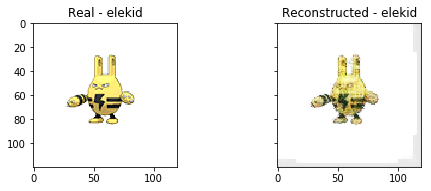

Epoch: 294, Training Loss: 0.01, time: 61.39


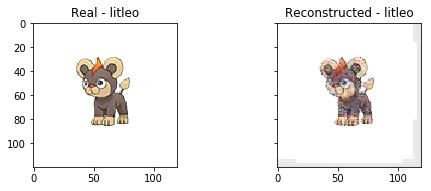

Epoch: 295, Training Loss: 0.01, time: 61.50


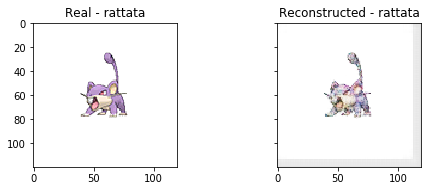

Epoch: 296, Training Loss: 0.01, time: 63.06


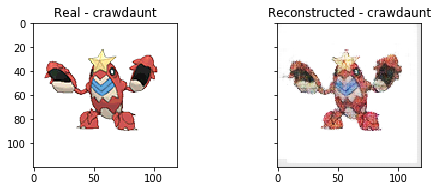

Epoch: 297, Training Loss: 0.01, time: 62.60


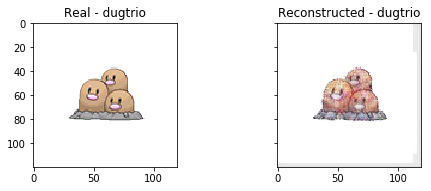

Epoch: 298, Training Loss: 0.01, time: 63.46


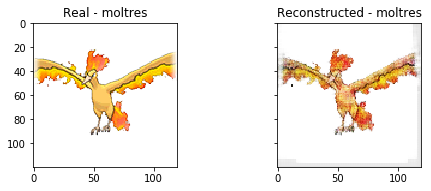

Epoch: 299, Training Loss: 0.01, time: 62.69


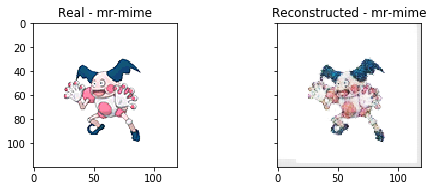

Epoch: 300, Training Loss: 0.01, time: 61.18


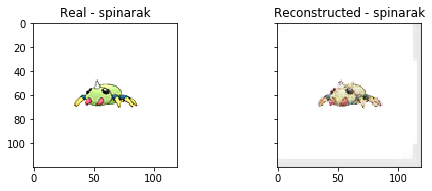

Epoch: 301, Training Loss: 0.01, time: 61.12


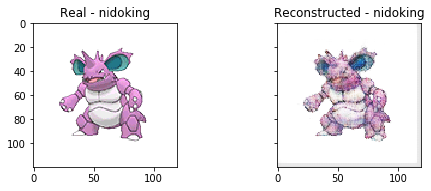

Epoch: 302, Training Loss: 0.01, time: 61.98


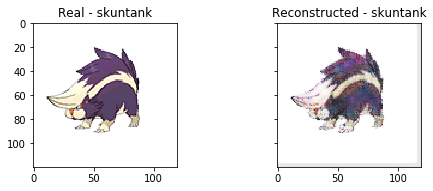

Epoch: 303, Training Loss: 0.01, time: 61.39


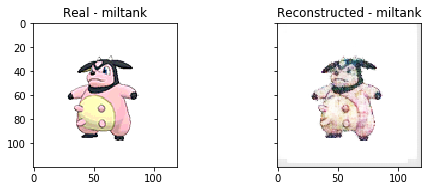

Epoch: 304, Training Loss: 0.01, time: 60.70


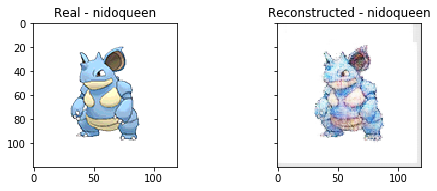

Epoch: 305, Training Loss: 0.01, time: 59.54


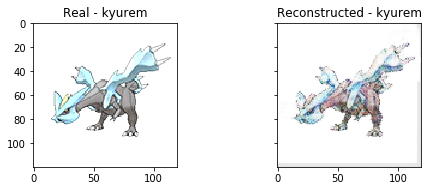

Epoch: 306, Training Loss: 0.01, time: 59.41


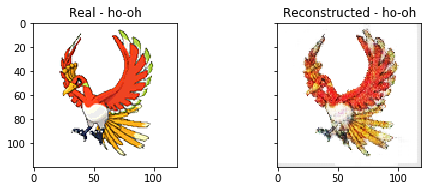

Epoch: 307, Training Loss: 0.01, time: 58.36


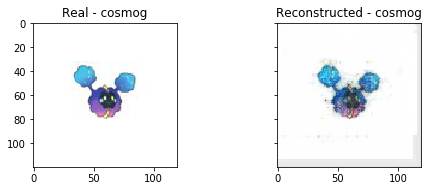

Epoch: 308, Training Loss: 0.01, time: 59.39


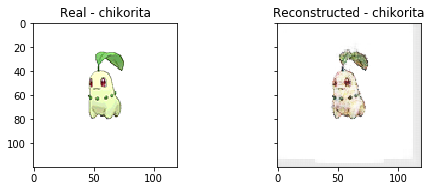

Epoch: 309, Training Loss: 0.01, time: 60.83


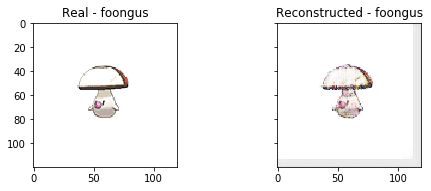

Epoch: 310, Training Loss: 0.01, time: 61.96


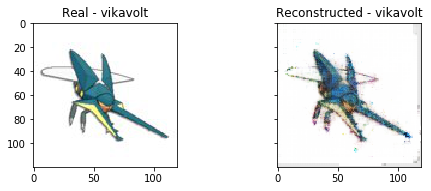

Epoch: 311, Training Loss: 0.01, time: 64.68


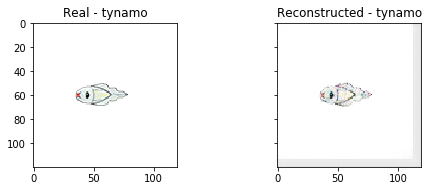

Epoch: 312, Training Loss: 0.01, time: 60.30


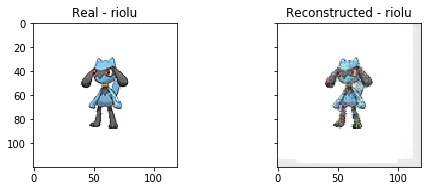

Epoch: 313, Training Loss: 0.01, time: 61.09


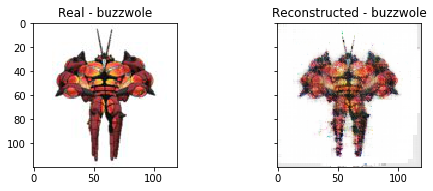

Epoch: 314, Training Loss: 0.01, time: 60.66


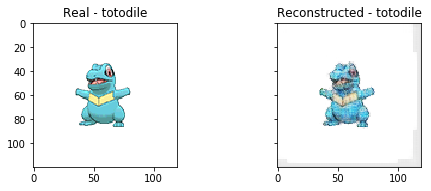

Epoch: 315, Training Loss: 0.01, time: 61.67


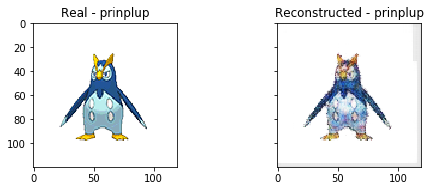

Epoch: 316, Training Loss: 0.01, time: 60.95


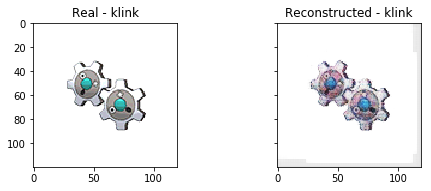

Epoch: 317, Training Loss: 0.01, time: 60.57


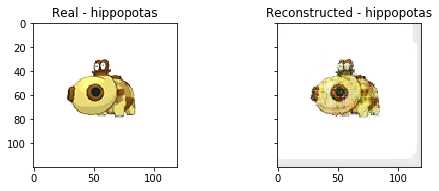

Epoch: 318, Training Loss: 0.01, time: 61.07


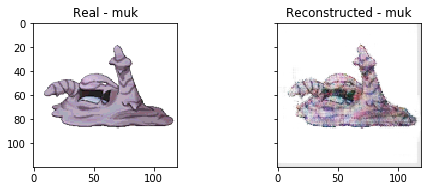

Epoch: 319, Training Loss: 0.01, time: 60.38


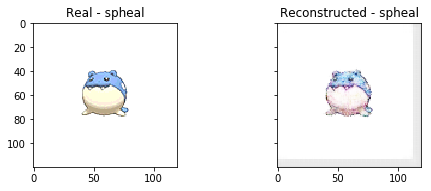

Epoch: 320, Training Loss: 0.01, time: 61.23


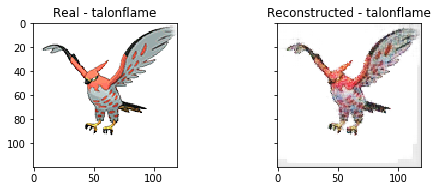

Epoch: 321, Training Loss: 0.01, time: 61.55


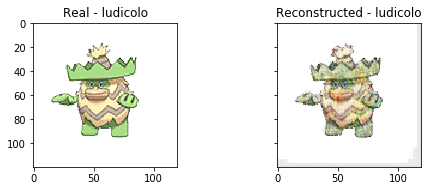

Epoch: 322, Training Loss: 0.01, time: 61.84


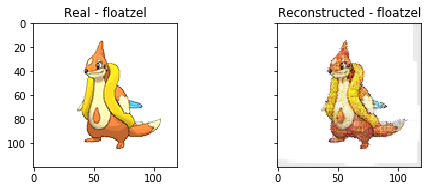

Epoch: 323, Training Loss: 0.01, time: 61.95


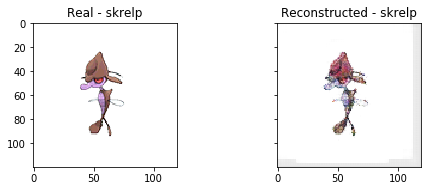

Epoch: 324, Training Loss: 0.01, time: 62.83


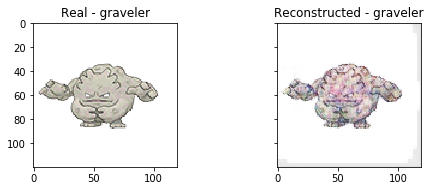

Epoch: 325, Training Loss: 0.01, time: 62.47


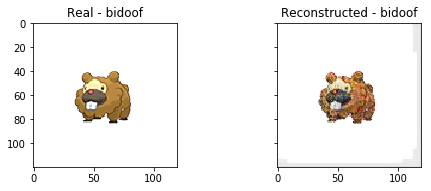

Epoch: 326, Training Loss: 0.01, time: 64.06


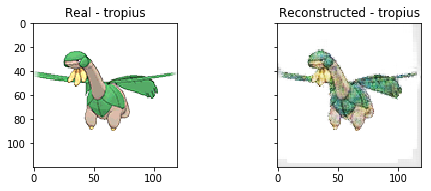

Epoch: 327, Training Loss: 0.01, time: 63.30


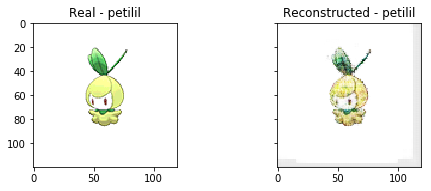

Epoch: 328, Training Loss: 0.01, time: 63.79


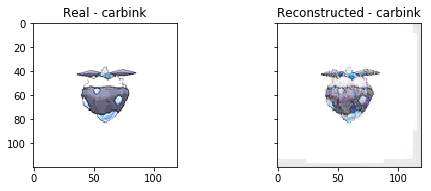

Epoch: 329, Training Loss: 0.01, time: 63.29


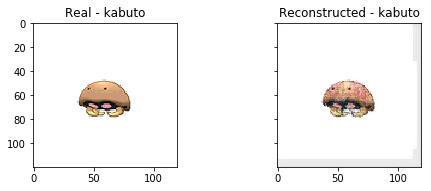

Epoch: 330, Training Loss: 0.01, time: 62.41


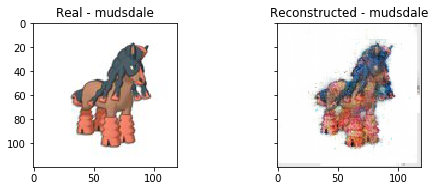

Epoch: 331, Training Loss: 0.01, time: 61.81


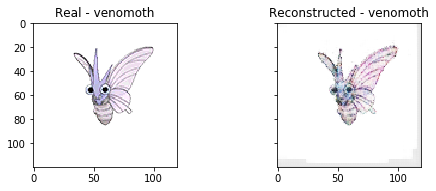

Epoch: 332, Training Loss: 0.01, time: 60.93


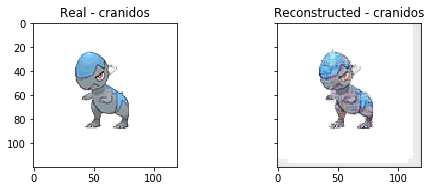

Epoch: 333, Training Loss: 0.01, time: 61.17


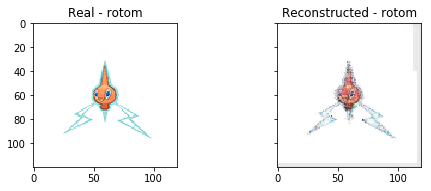

Epoch: 334, Training Loss: 0.01, time: 60.49


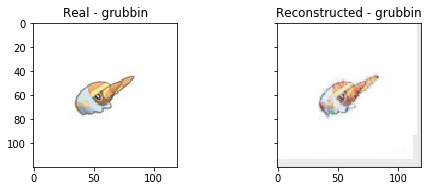

Epoch: 335, Training Loss: 0.01, time: 60.60


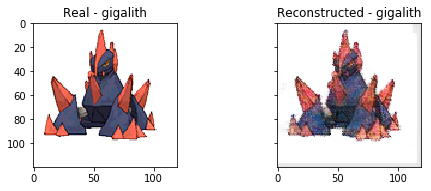

Epoch: 336, Training Loss: 0.01, time: 60.66


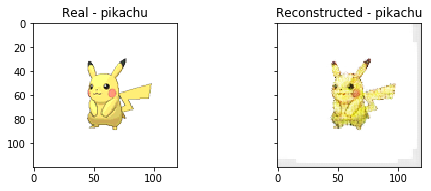

Epoch: 337, Training Loss: 0.01, time: 60.74


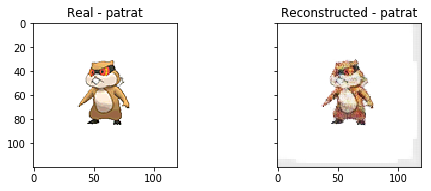

Epoch: 338, Training Loss: 0.01, time: 59.53


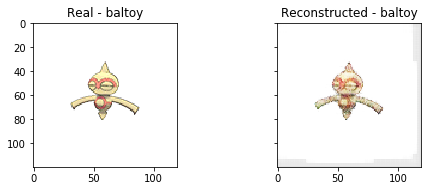

Epoch: 339, Training Loss: 0.01, time: 60.22


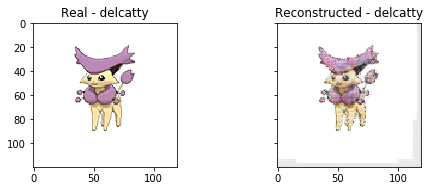

Epoch: 340, Training Loss: 0.01, time: 59.04


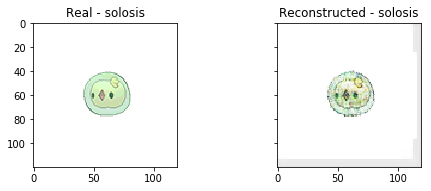

Epoch: 341, Training Loss: 0.01, time: 58.36


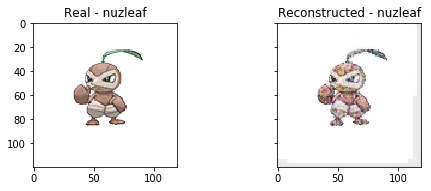

Epoch: 342, Training Loss: 0.01, time: 57.06


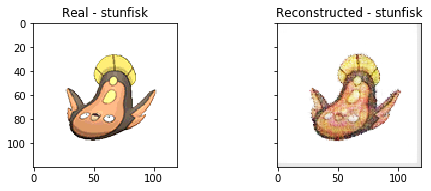

Epoch: 343, Training Loss: 0.01, time: 58.93


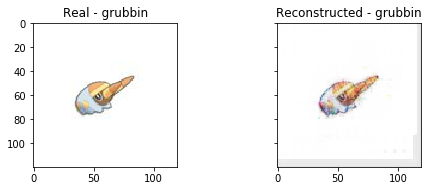

Epoch: 344, Training Loss: 0.01, time: 57.90


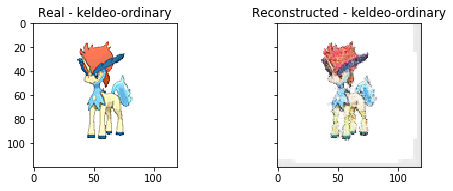

Epoch: 345, Training Loss: 0.01, time: 57.92


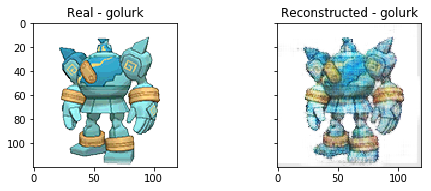

Epoch: 346, Training Loss: 0.01, time: 58.43


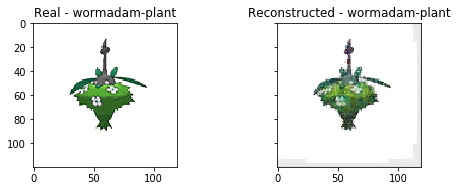

Epoch: 347, Training Loss: 0.01, time: 58.27


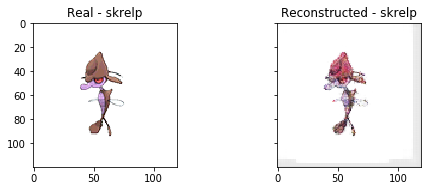

Epoch: 348, Training Loss: 0.01, time: 59.33


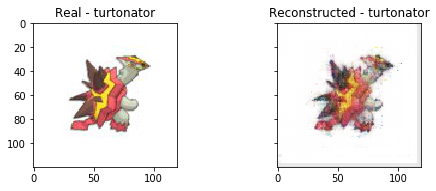

Epoch: 349, Training Loss: 0.01, time: 60.29


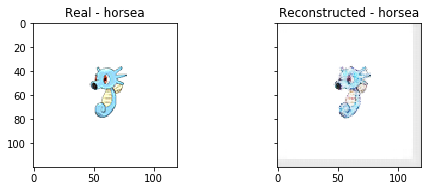

Epoch: 350, Training Loss: 0.01, time: 58.92


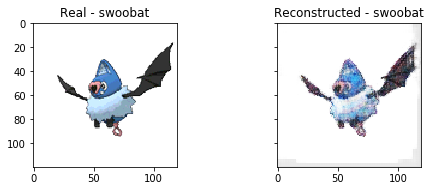

Epoch: 351, Training Loss: 0.01, time: 59.76


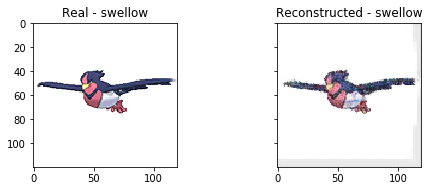

Epoch: 352, Training Loss: 0.01, time: 59.52


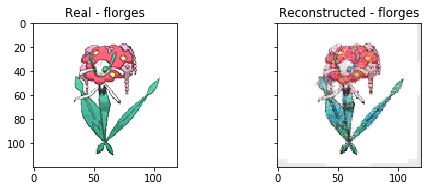

Epoch: 353, Training Loss: 0.01, time: 59.29


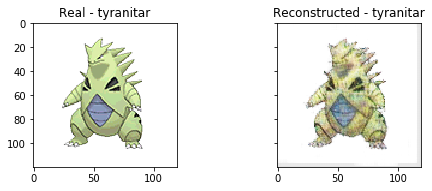

Epoch: 354, Training Loss: 0.01, time: 60.39


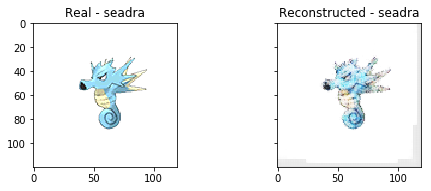

Epoch: 355, Training Loss: 0.01, time: 59.19


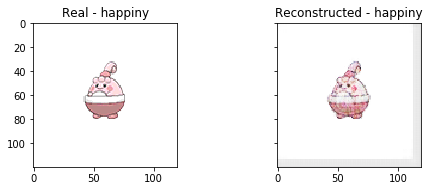

Epoch: 356, Training Loss: 0.01, time: 59.73


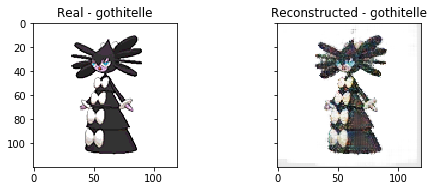

Epoch: 357, Training Loss: 0.01, time: 60.62


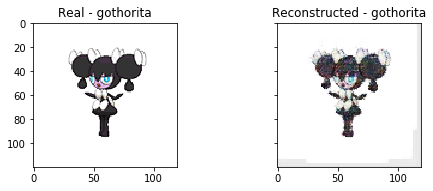

Epoch: 358, Training Loss: 0.01, time: 60.36


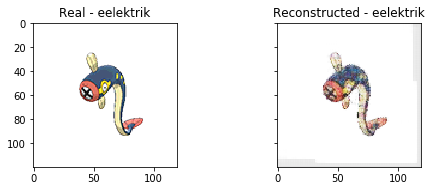

Epoch: 359, Training Loss: 0.01, time: 60.22


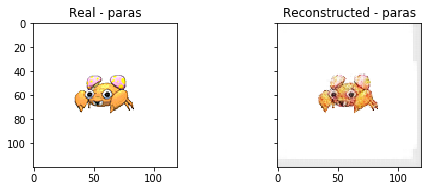

Epoch: 360, Training Loss: 0.01, time: 60.18


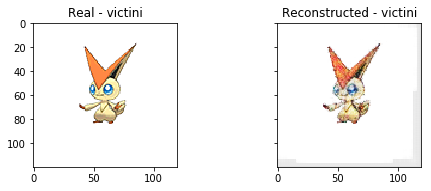

Epoch: 361, Training Loss: 0.01, time: 59.67


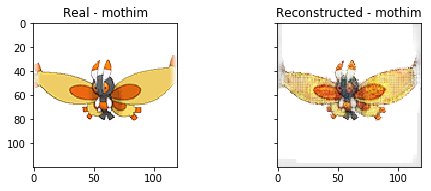

Epoch: 362, Training Loss: 0.01, time: 59.18


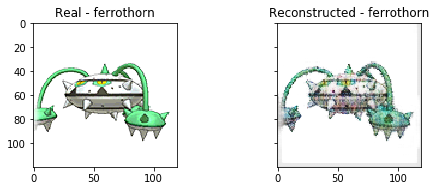

Epoch: 363, Training Loss: 0.01, time: 57.90


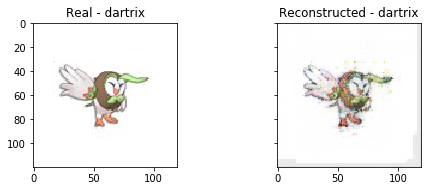

Epoch: 364, Training Loss: 0.01, time: 59.26


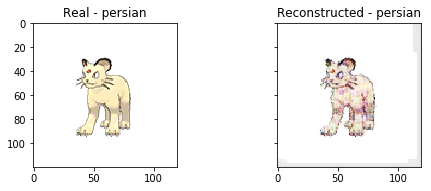

Epoch: 365, Training Loss: 0.01, time: 57.83


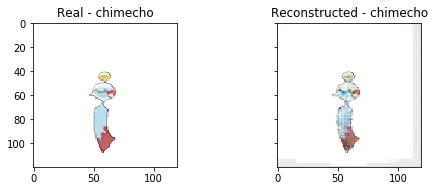

Epoch: 366, Training Loss: 0.01, time: 58.76


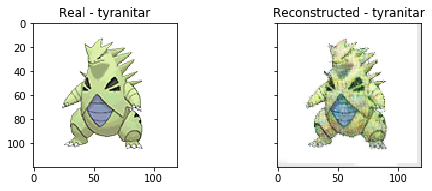

Epoch: 367, Training Loss: 0.01, time: 57.93


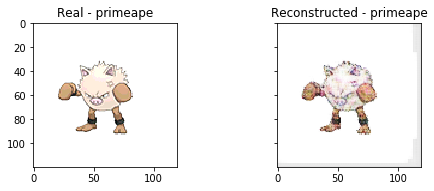

Epoch: 368, Training Loss: 0.01, time: 59.48


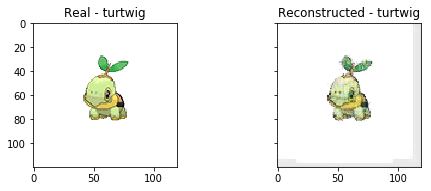

Epoch: 369, Training Loss: 0.01, time: 58.87


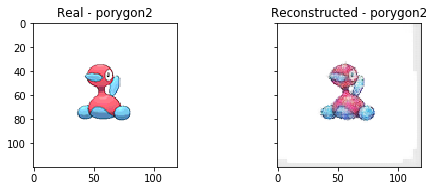

Epoch: 370, Training Loss: 0.01, time: 59.16


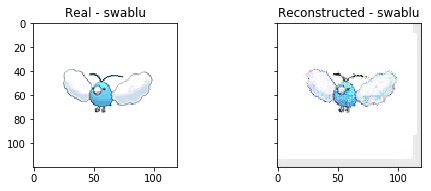

Epoch: 371, Training Loss: 0.01, time: 59.68


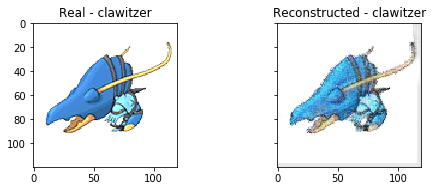

Epoch: 372, Training Loss: 0.01, time: 59.21


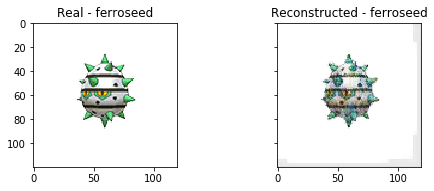

Epoch: 373, Training Loss: 0.01, time: 58.89


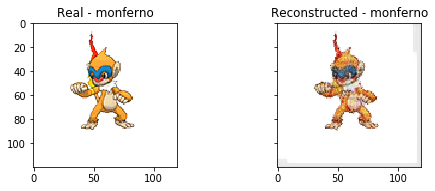

Epoch: 374, Training Loss: 0.01, time: 59.04


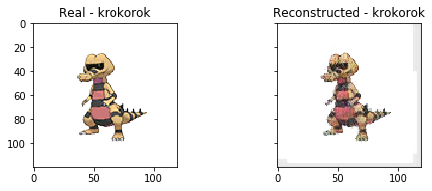

Epoch: 375, Training Loss: 0.01, time: 58.66


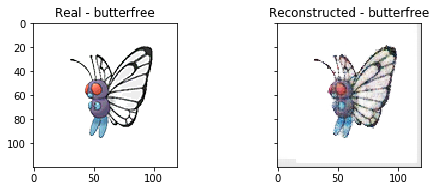

Epoch: 376, Training Loss: 0.01, time: 60.01


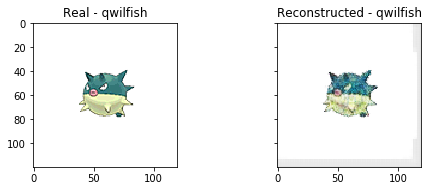

Epoch: 377, Training Loss: 0.01, time: 58.91


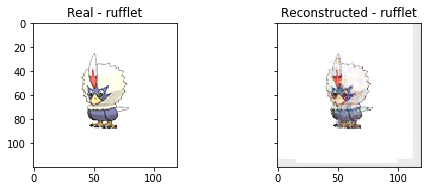

Epoch: 378, Training Loss: 0.01, time: 60.78


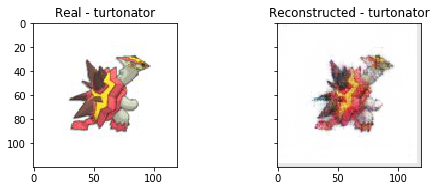

Epoch: 379, Training Loss: 0.01, time: 61.31


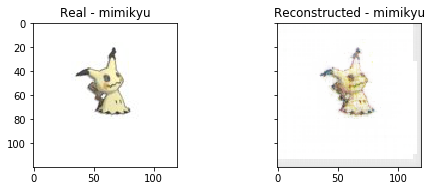

Epoch: 380, Training Loss: 0.01, time: 63.11


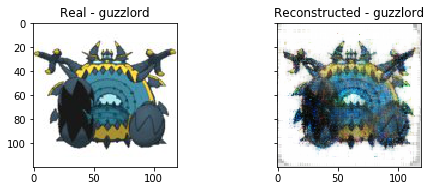

Epoch: 381, Training Loss: 0.01, time: 62.28


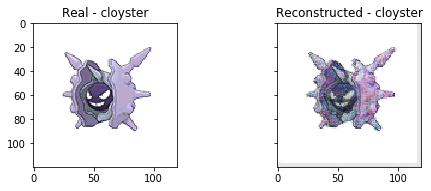

Epoch: 382, Training Loss: 0.01, time: 61.89


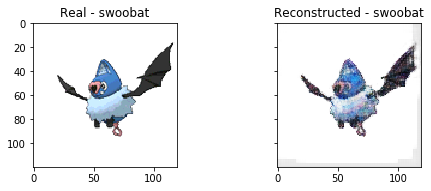

Epoch: 383, Training Loss: 0.01, time: 60.96


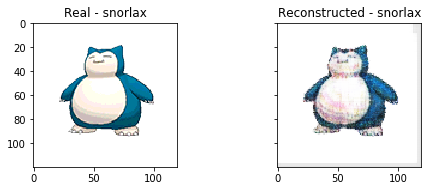

Epoch: 384, Training Loss: 0.01, time: 61.38


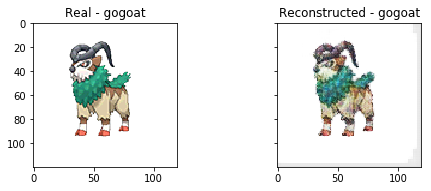

Epoch: 385, Training Loss: 0.01, time: 59.38


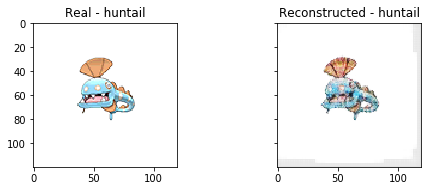

Epoch: 386, Training Loss: 0.01, time: 60.65


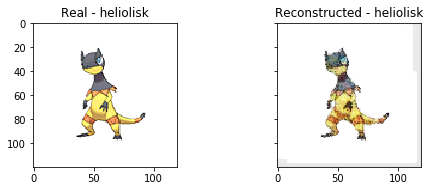

Epoch: 387, Training Loss: 0.01, time: 61.07


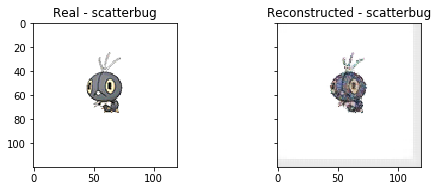

Epoch: 388, Training Loss: 0.01, time: 63.05


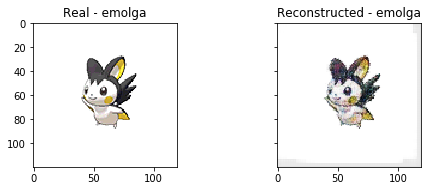

Epoch: 389, Training Loss: 0.01, time: 61.74


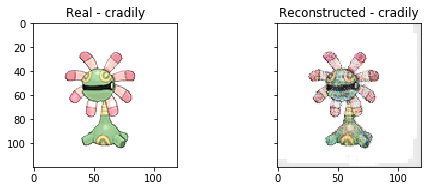

Epoch: 390, Training Loss: 0.01, time: 61.08


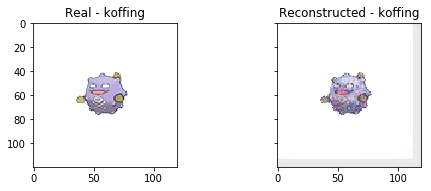

Epoch: 391, Training Loss: 0.01, time: 61.67


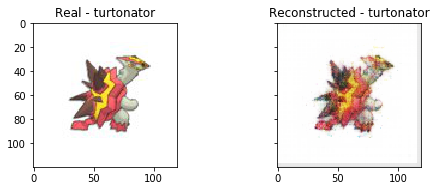

Epoch: 392, Training Loss: 0.01, time: 61.89


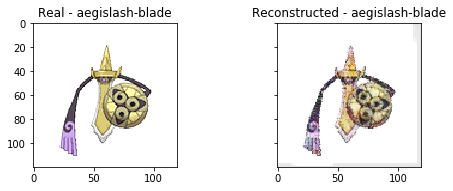

Epoch: 393, Training Loss: 0.01, time: 63.34


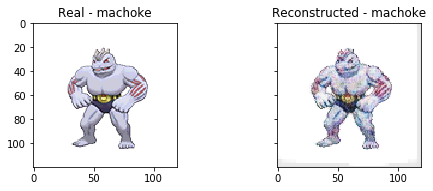

Epoch: 394, Training Loss: 0.01, time: 61.73


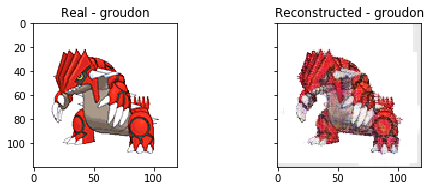

Epoch: 395, Training Loss: 0.01, time: 64.09


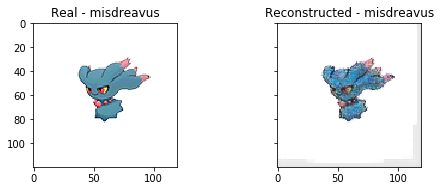

Epoch: 396, Training Loss: 0.01, time: 64.89


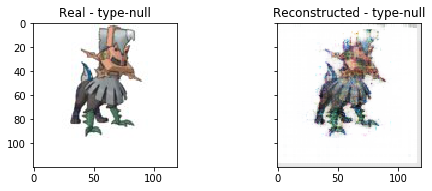

Epoch: 397, Training Loss: 0.01, time: 64.45


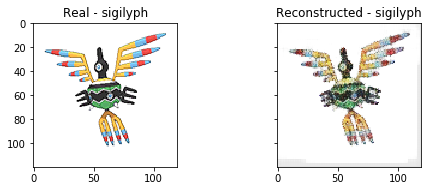

Epoch: 398, Training Loss: 0.01, time: 65.32


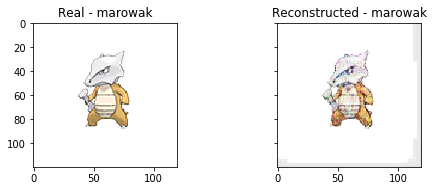

Epoch: 399, Training Loss: 0.01, time: 67.44


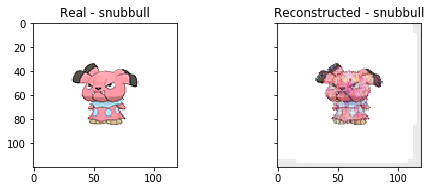

Epoch: 400, Training Loss: 0.01, time: 68.76


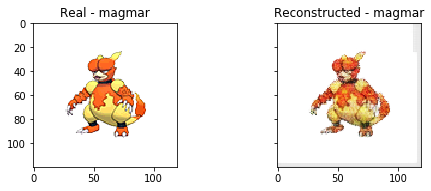

time elapsed: 20292.37 


In [12]:
before = time()
loss_history = []

for epoch in range(epochs):
    
    running_loss = 0.0
    epoch_before = time()
    for i, batch in enumerate(getBatches(trainTensor, batch_size)):
        
        # forward
        outputs = model(batch)        
        loss = criteration(outputs, batch)
        
        # backward
        optimizer.zero_grad()        
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * batch.size(0) 
        
    epoch_loss = running_loss / len(trainTensor)
    loss_history.append(epoch_loss)
    

    print(f'Epoch: {epoch + 1}, Training Loss: {epoch_loss:.2f}, time: {time() - epoch_before:.2f}')
        
     # after a epoch, try to reconstruct a random pokemon.
    with torch.no_grad():
        randomIndex = np.random.randint(0, len(trainTensor))

        label = trainLabels[randomIndex]
        pokemonTensor = trainTensor[randomIndex].reshape(1,4,120,120)
        output = model(pokemonTensor)
            
        f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
        plt.subplots_adjust(left=0.0, bottom=0, right=1.0, top=0.5,wspace=0.3, hspace=0.3)
        ax1.imshow(trainTensor[randomIndex].permute(1,2,0))
        ax2.imshow(output[0].permute(1,2,0))
        ax1.set_title(f"Real - {label}")
        ax2.set_title(f"Reconstructed - {label}")
        plt.show() 
    
    if epoch in [50, 100, 150, 200, 250, 300, 350]:
        path = f"model{epoch}.pt"
        torch.save(model.state_dict(), path)

print(f"time elapsed: {time()-before:.2f} ")

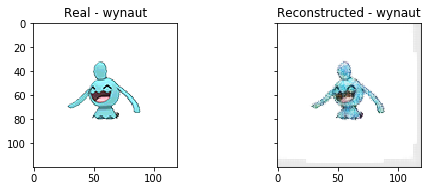

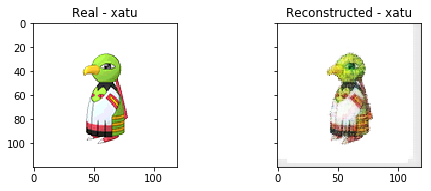

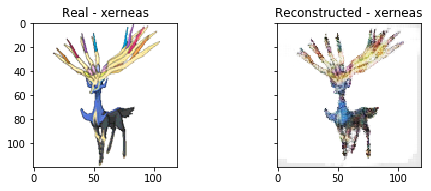

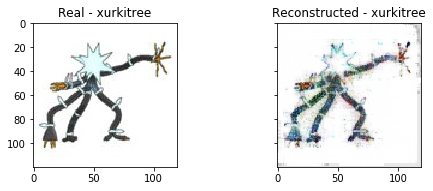

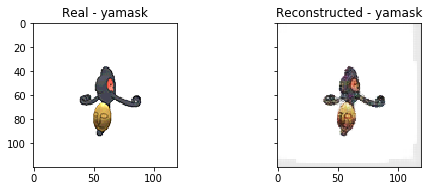

...

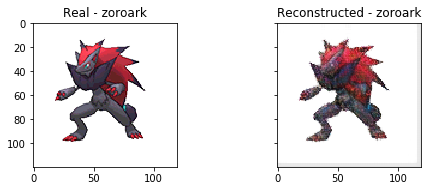

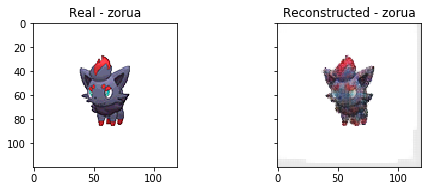

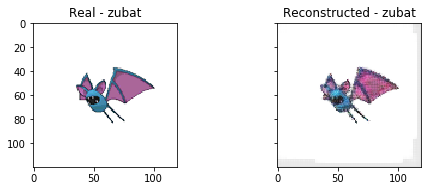

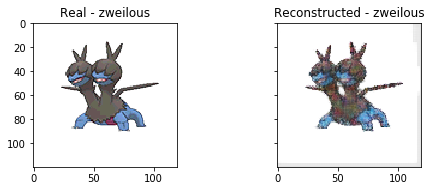

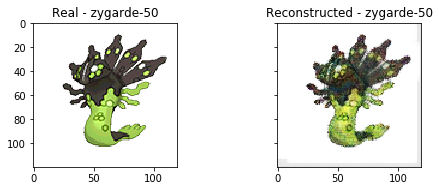

In [19]:
for i in range(len(testTensor)):
    
    tensor = testTensor[i].reshape(1,4,120,120)
    label = testLabels[i]

    with torch.no_grad():
        output = model(tensor)
        
        f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
        plt.subplots_adjust(left=0.0, bottom=0, right=1.0, top=0.5,wspace=0.3, hspace=0.3)
        ax1.imshow(testTensor[i].permute(1,2,0))
        ax2.imshow(output[0].permute(1,2,0))
        ax1.set_title(f"Real - {label}")
        ax2.set_title(f"Reconstructed - {label}")
        plt.show() 

